## Which Explanation Makes Sense? A Critical Evaluation of Local Explanations for Assessing Cervical Cancer Risk Factors


### Submitted for UIUC CS-598: Deep Learning For Healthcare, SP24


**Instructors**:

    Jimeng Sun
    Siddhartha Laghuvarapu



**Prepared by:**

    Himangshu Das 			hdas4@illinois.edu

    Jeremy Samuel 			sjeremy3@illinois.edu

    Mahesh Matta 				maheshm3@illinois.edu

Team: 84

Project Github [link](https://github.com/dasshims/UIUC-CS598-FinalProject)

## **Introduction**


Cervical cancer happens when cells in the cervix, the lower part of the uterus that connects to the vagina, start to become abnormal. While it isn't perfectly clear what sparks the cervical cells to change their DNA, it is certain that human papilloma virus, or HPV, plays a role. The early stages of cervical cancer generally show no signs or symptoms. Hence it is very important to be able to detect it sooner. The paper offers a thorough examination of various local interpretability techniques used to elucidate the risk factors linked with cervical cancer. Its aim is to support healthcare professionals utilizing AI by providing insights into the most suitable explanation methods for specific situations. The framework proposed in the paper will be assessed to gauge the effectiveness of different explanations in assessing cervical cancer risk, and to determine how various explanations can be tailored to different patient scenarios. Additionally, the paper will introduce an empirical approach for calculating the faithfulness metric of different machine learning interpretability methods. This approach involves analyzing feature and rank agreement, and ensuring that removing the top N features, as predicted by local explanations, does not significantly impact model performance.


## **Scope of Reproducibility**
The original paper focuses on evaluating different explanation methods for assessing cervical cancer risk. It aims to provide insights into the quality and suitability of these explanations in a healthcare context. The contribution lies in offering a systematic framework for interpreting model predictions and assessing the performance of various explanation techniques. The scope of reproducibility in the project draft involves replicating the evaluation of explanation methods conducted in the original paper. This includes implementing the systematic approach for interpreting model predictions and comparing the performances of different explanation methods in the context of cervical cancer risk assessment.



References:
1. Ayad, Wafa & Bonnier, Thomas & Bosch, Benjamin & Read, Jesse & Parbhoo,
Sonali. (2023). Which Explanation Makes Sense? A Critical Evaluation of Local
Explanations for Assessing Cervical Cancer Risk Factors Ecole polytechnique. 1-50.
2. Data Source: https://archive.ics.uci.edu/dataset/383/cervical+cancer+risk+factors
3. Original setup: https://github.com/cwayad/Local-Explanations-for-Cervical-Cancer
4. https://www.kaggle.com/code/renadope/cervical-cancer-classification-99-4-recall

## **Methodology**

The methodology involves training multiple machine learning models (LR, RF, SVM, KNN, MLP) on preprocessed data to predict cervical cancer risk. The Random Forest model is selected as the best-performing model based on AUC performance. Local explainability techniques are then applied to interpret the predictions of the Random Forest model, including LIME and SHAP, to assess the quality of different explanations for cervical cancer risk assessment. Various metrics are computed to determine which explanation method makes the most sense for assessing cervical cancer risk.

The paper proposes a systematic approach for interpreting the predictions of a black-box model using multiple interpretability methods, and compare the explanations based on desired criteria. The approach consists
of three key phases: 
a) first we train a series of models for cervical cancer risk assessment and choose the best among these models; 
b) next, we interpret the models from a) using a series of local explainability techniques; 
c) we compute a series of metrics to assess the plausibility and coherency of each of the explainability methods considered.

It is as described in the figure below - 
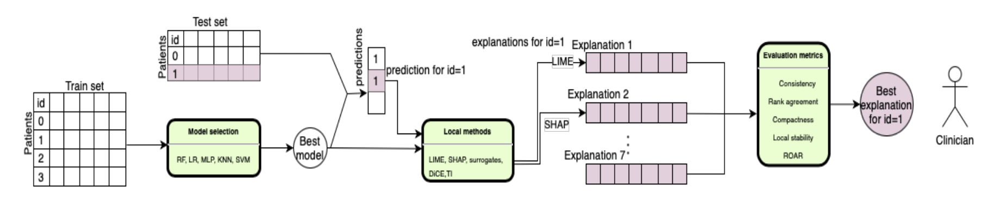

### **Data**
  ### **Data description**:
   The original paper uses e Cervical cancer risk factors dataset X from the UCI repository, the data is available publicly [here](https://archive.ics.uci.edu/dataset/383/cervical+cancer+risk+factors). This data contains 858 female patients characterized by D = 35 features including demographic information such as age and number of pregnancies, clinical tests such as Hinselmann, Schiller and Citology, many Sexually Transmitted Diseases such as HPV and AIDS, and diagnosis taken by the patients such as HPV and CIN. For the scope of the project we will be reusing the sample dataset from the original paper.

  ### **Implementation code**
  The .csv is stored in GDrive and made available on runtime using [gdown](https://github.com/wkentaro/gdown) library. Majority of time was spent on importing the code from the original [paper](https://github.com/cwayad/Local-Explanations-for-Cervical-Cancer) setting up the Google colab environment.

  The dataset comprises demographic information, habits, and historic medical records of 858 patients. Several patients decided not to answer some of the questions because of privacy concerns (missing values). The code uses the ADASYN (AdaptiveSynthetic Sampling) technique in order to balance balanced the dataset by oversampling the minority class. After preprocessing with ADASYN, the new dataset contains 1677 patients. The dataset is split into 80% for training and 20% for testing.

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [1]:
# Downloads data from Gdrive hosted in hdas4@illinois.edu
import gdown

url = "https://drive.google.com/file/d/1jH2A93bp2z86Avm08ev7Fz6khDDQia63/view?usp=sharing"
output = "risk_factors_cervical_cancer.csv"
gdown.download(url=url, output=output, fuzzy=True)

In [1]:
!pip install psutil -U kaleido
import plotly.io as pio

In [2]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

from sklearn.impute import SimpleImputer
from sklearn.model_selection import StratifiedShuffleSplit
from typing import List
from sklearn.preprocessing import RobustScaler,StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import precision_recall_fscore_support

from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.over_sampling import RandomOverSampler

from plotly.offline import plot, iplot, init_notebook_mode
#init_notebook_mode(connected=True)

import warnings

warnings.filterwarnings('ignore')

# Overview - Exploratory Data Analysis


In [3]:
risk_factor_df = pd.read_csv('risk_factors_cervical_cancer.csv', delimiter=',', encoding='utf-8') 
risk_factor_df.head()

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs: Time since first diagnosis,STDs: Time since last diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
0,18,4,15,1,0,0,0,0,0,0,...,?,?,0,0,0,0,0,0,0,0
1,15,1,14,1,0,0,0,0,0,0,...,?,?,0,0,0,0,0,0,0,0
2,34,1,?,1,0,0,0,0,0,0,...,?,?,0,0,0,0,0,0,0,0
3,52,5,16,4,1,37,37,1,3,0,...,?,?,1,0,1,0,0,0,0,0
4,46,3,21,4,0,0,0,1,15,0,...,?,?,0,0,0,0,0,0,0,0


In [4]:
risk_factor_df[risk_factor_df['Dx:HPV']==1  ]

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs: Time since first diagnosis,STDs: Time since last diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
3,52,5,16,4,1,37,37,1,3,0,...,?,?,1,0,1,0,0,0,0,0
8,45,1,20,5,0,0,0,0,0,0,...,?,?,1,0,1,1,0,0,0,0
23,40,1,20,2,0,0,0,1,15,0,...,?,?,1,0,1,0,1,1,0,1
64,38,2,15,4,0,0,0,1,16,0,...,?,?,1,0,1,0,0,1,0,1
109,32,2,17,1,0,0,0,?,?,?,...,?,?,0,0,1,1,0,0,0,0
188,27,5,19,2,0,0,0,1,3,0,...,?,?,1,0,1,1,0,0,1,0
335,29,2,18,4,0,0,0,0,0,0,...,?,?,1,0,1,1,0,1,1,1
372,21,5,13,3,1,1.266972909,0.513202128,1,0.75,0,...,?,?,0,0,1,0,0,0,0,0
578,19,1,18,1,0,0,0,1,1,0,...,?,?,1,0,1,1,1,1,1,1
610,21,2,18,3,0,0,0,0,0,1,...,?,?,1,0,1,1,1,1,0,1


In [5]:
risk_factor_df['Dx:HPV'].value_counts()

0    840
1     18
Name: Dx:HPV, dtype: int64

In [6]:
risk_factor_df.isna().sum()

Age                                   0
Number of sexual partners             0
First sexual intercourse              0
Num of pregnancies                    0
Smokes                                0
Smokes (years)                        0
Smokes (packs/year)                   0
Hormonal Contraceptives               0
Hormonal Contraceptives (years)       0
IUD                                   0
IUD (years)                           0
STDs                                  0
STDs (number)                         0
STDs:condylomatosis                   0
STDs:cervical condylomatosis          0
STDs:vaginal condylomatosis           0
STDs:vulvo-perineal condylomatosis    0
STDs:syphilis                         0
STDs:pelvic inflammatory disease      0
STDs:genital herpes                   0
STDs:molluscum contagiosum            0
STDs:AIDS                             0
STDs:HIV                              0
STDs:Hepatitis B                      0
STDs:HPV                              0


In [7]:
risk_factor_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 858 entries, 0 to 857
Data columns (total 36 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   Age                                 858 non-null    int64 
 1   Number of sexual partners           858 non-null    object
 2   First sexual intercourse            858 non-null    object
 3   Num of pregnancies                  858 non-null    object
 4   Smokes                              858 non-null    object
 5   Smokes (years)                      858 non-null    object
 6   Smokes (packs/year)                 858 non-null    object
 7   Hormonal Contraceptives             858 non-null    object
 8   Hormonal Contraceptives (years)     858 non-null    object
 9   IUD                                 858 non-null    object
 10  IUD (years)                         858 non-null    object
 11  STDs                                858 non-null    object

# Preprocessing

In [8]:
def print_unique_values_df(df: pd.DataFrame):
    for col in list(df):
        print("Unique Values for "'{}'":{}".format(str(col), risk_factor_df[col].unique()))
        print("dtype for {} is :{}".format(str(col), risk_factor_df[col].dtypes))
        print("-" * 150)


#def print_unique_values_for_col(df: pd.DataFrame, col_names: List[str] = None):
#    for col in col_names:
#        print("Unique Values for "'{}'":{}".format(str(col), risk_factor_df[col].unique()))

In [9]:
print_unique_values_df(risk_factor_df)

Unique Values for Age:[18 15 34 52 46 42 51 26 45 44 27 43 40 41 39 37 38 36 35 33 31 32 30 23
 28 29 20 25 21 24 22 48 19 17 16 14 59 79 84 47 13 70 50 49]
dtype for Age is :int64
------------------------------------------------------------------------------------------------------------------------------------------------------
Unique Values for Number of sexual partners:['4' '1' '5' '3' '2' '6' '?' '7' '15' '8' '10' '28' '9']
dtype for Number of sexual partners is :object
------------------------------------------------------------------------------------------------------------------------------------------------------
Unique Values for First sexual intercourse:['15' '14' '?' '16' '21' '23' '17' '26' '20' '25' '18' '27' '19' '24' '32'
 '13' '29' '11' '12' '22' '28' '10']
dtype for First sexual intercourse is :object
------------------------------------------------------------------------------------------------------------------------------------------------------
Unique Values for

In [10]:
#these columns are not of type object, but are of type numeric
cols_to_convert = ['Number of sexual partners', 'First sexual intercourse', 'Num of pregnancies', 'Smokes',
                   'Smokes (years)', 'Smokes (packs/year)', 'Hormonal Contraceptives',
                   'Hormonal Contraceptives (years)', 'IUD', 'IUD (years)', 'STDs', 'STDs (number)',
                   'STDs:condylomatosis', 'STDs:cervical condylomatosis', 'STDs:vaginal condylomatosis',
                   'STDs:vulvo-perineal condylomatosis', 'STDs:syphilis', 'STDs:pelvic inflammatory disease',
                   'STDs:genital herpes', 'STDs:molluscum contagiosum', 'STDs:AIDS', 'STDs:HIV', 'STDs:Hepatitis B',
                   'STDs:HPV', 'STDs: Time since first diagnosis',
                   'STDs: Time since last diagnosis']
# for i in range(0,len(cols_to_convert)):
#     print("{}={}".format(i,cols_to_convert[i]))
risk_factor_df[cols_to_convert] = risk_factor_df[cols_to_convert].apply(pd.to_numeric, errors="coerce")
risk_factor_df[cols_to_convert].fillna(np.nan, inplace=True)
imp = SimpleImputer(strategy="median")
X = imp.fit_transform(risk_factor_df)
risk_factor_df = pd.DataFrame(X, columns=list(risk_factor_df.columns))

## Categorizing data based on age

In [11]:
def age_cat(age):
    if age < 12:
        return "Child"
    elif age < 20:
        return "Teen"
    elif age < 30:
        return "20's"
    elif age < 40:
        return "30's"
    elif age < 50:
        return "40's"
    elif age < 60:
        return "50's"
    elif age < 70:
        return "60's"
    else:
        return "70+"


risk_factor_df["Age"] = risk_factor_df["Age"].astype(int)
risk_factor_df["age_cat"] = risk_factor_df["Age"].apply(age_cat)

In [12]:
std_cols = {'STDs:condylomatosis',
            'STDs:cervical condylomatosis',
            'STDs:vaginal condylomatosis',
            'STDs:vulvo-perineal condylomatosis',
            'STDs:syphilis',
            'STDs:pelvic inflammatory disease',
            'STDs:genital herpes',
            'STDs:molluscum contagiosum',
            'STDs:AIDS',
            'STDs:HIV',
            'STDs:Hepatitis B',
            'STDs:HPV'}

risk_factor_df["total_std"] = risk_factor_df[list(std_cols)].sum(axis=1)
std_agg = risk_factor_df.groupby("age_cat", as_index=False)[list(std_cols)].sum()

In [13]:
test_cols = ["Hinselmann", "Schiller", "Citology", "Biopsy"]
risk_factor_df["total_tests"] = risk_factor_df[test_cols].sum(axis = 1)

In [14]:
to_int_and_beyond = {"total_tests",
                     "total_std",
                     "Smokes",
                     "Biopsy",
                     "Dx:Cancer",
                     "Num of pregnancies",
                     "Number of sexual partners",
                     "First sexual intercourse",
                     "Hormonal Contraceptives",
                     "IUD",
                     "STDs",
                     "STDs (number)",
                     "STDs: Number of diagnosis",
                     "Dx:CIN",
                     "Dx:HPV",
                     "Dx",
                     "Hinselmann",
                     "Schiller",
                     "Biopsy",
                     "Citology"}

to_int_and_beyond = to_int_and_beyond.union(std_cols)

for col in to_int_and_beyond:
    risk_factor_df[col] = risk_factor_df[col].astype(int)

In [15]:
risk_factor_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 858 entries, 0 to 857
Data columns (total 39 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Age                                 858 non-null    int32  
 1   Number of sexual partners           858 non-null    int32  
 2   First sexual intercourse            858 non-null    int32  
 3   Num of pregnancies                  858 non-null    int32  
 4   Smokes                              858 non-null    int32  
 5   Smokes (years)                      858 non-null    float64
 6   Smokes (packs/year)                 858 non-null    float64
 7   Hormonal Contraceptives             858 non-null    int32  
 8   Hormonal Contraceptives (years)     858 non-null    float64
 9   IUD                                 858 non-null    int32  
 10  IUD (years)                         858 non-null    float64
 11  STDs                                858 non-n

In [16]:
corr_matrix = risk_factor_df.corr()
corr_matrix.fillna(0,inplace=True)
corr_graph = px.imshow(corr_matrix, aspect="auto")
corr_graph.show()

In [17]:
n = 7
target = label = "Dx:Cancer"
corr = risk_factor_df.select_dtypes(include=np.number).corr()

x = corr.nlargest(n,target).index
corr_df =  risk_factor_df[list(x)]
corr = corr_df.corr()
fig = px.imshow(corr,color_continuous_scale = "PuBu")
fig.update_layout(title="Top "+str(n)+" Features Correlated With "+str(target).capitalize())
fig.show()

In [18]:
def stats(x):
    temp1=(df[[x,label]].value_counts(normalize=True).round(decimals=3)*100).reset_index().rename(columns={0:'Overall_Percent'})
    Coloumn_To_Aggregate=[x,label]
    df6=pd.merge(df.groupby(Coloumn_To_Aggregate).size().reset_index(name='ind_siz'), 
                 df.groupby(Coloumn_To_Aggregate[:-1]).size().reset_index(name='Total'), on =Coloumn_To_Aggregate[:-1])
    df6['Category_Percent']=round((df6['ind_siz']/df6['Total'])*100 ,2)
    temp2=df6[[x,label,'Category_Percent']]
    temp3=temp1.merge(temp2,on=[x,label])
    return temp3.pivot(columns=x,index=label)

In [19]:
df=risk_factor_df
label='age_cat'

In [20]:
stats('Dx:Cancer')

Overall_Percent      Category_Percent       
Dx:Cancer               0    1                0      1
age_cat                                               
20's                 45.3  0.6            46.31  27.78
30's                 24.7  0.9            25.24  44.44
40's                  6.2  0.3             6.31  16.67
50's                  0.5  0.1             0.48   5.56
70+                   0.5  NaN             0.48    NaN
Teen                 20.7  0.1            21.19   5.56

# Visualization

In [21]:
age_dist = px.histogram(risk_factor_df, x="Age", marginal="box", color_discrete_sequence=["palevioletred"])
age_dist.update_layout(title="Age distribution")
age_dist.show()

## Pregnancy Distribution by Age

In [22]:
tempp=risk_factor_df.sort_values(by="Age",ascending=True)

In [23]:
risk_factor_df.age_cat

0      Teen
1      Teen
2      30's
3      50's
4      40's
       ... 
853    30's
854    30's
855    20's
856    30's
857    20's
Name: age_cat, Length: 858, dtype: object

In [24]:
age_preg_bar = px.box(risk_factor_df.sort_values(by="Age",ascending=True), x="age_cat", y="Num of pregnancies",
                      color_discrete_sequence=["darkblue"], points="outliers",
                      category_orders=["Teenager", "Twenties", "Thirties", "Forties", "Fifties","Sixties",
                                       "Seventy and over"])
age_preg_bar.update_xaxes(title="Age Category")
age_preg_bar.update_yaxes(title="Number of Pregnancies")
age_preg_bar.update_layout(title="Distribution of number of pregnancies per age group")
age_preg_bar.show()

## Risk factors for cervical cancer include:

### [From the mayo clinic:](https://www.mayoclinic.org/diseases-conditions/cervical-cancer/symptoms-causes/syc-20352501#:~:text=Cervical%20cancer%20is%20a%20type,in%20causing%20most%20cervical%20cancer.)

* Many sexual partners. The greater your number of sexual partners — and the greater your partner's number of sexual partners — the greater your chance of acquiring HPV.
* Early sexual activity. Having sex at an early age increases your risk of HPV.
* Other sexually transmitted infections (STIs). Having other STIs — such as chlamydia, gonorrhea, syphilis and HIV/AIDS — increases your risk of HPV.
* A weakened immune system. You may be more likely to develop cervical cancer if your immune system is weakened by another health condition and you have HPV.
* Smoking. Smoking is associated with squamous cell cervical cancer.
* Exposure to miscarriage prevention drug. If your mother took a drug called diethylstilbestrol (DES) while pregnant in the 1950s, you may have an increased risk of a certain type of cervical cancer called clear cell adenocarcinoma.

In [25]:
age_num_sex_partners = px.box(risk_factor_df.sort_values(by="Age",ascending=True), x="age_cat", y="Number of sexual partners",
                      color_discrete_sequence=["blue"], points="outliers",
                      category_orders=["Teenager", "Twenties", "Thirties", "Forties", "Fifties",
                                       "Seventy and over"])
age_num_sex_partners.update_xaxes(title="Age Category")
age_num_sex_partners.update_yaxes(title="Number of Sexual Partners")
age_num_sex_partners.update_layout(title="Distribution of number of sexual partners per age group")
age_num_sex_partners.show()

From the scatterplot, it is seen that the number of sexual partners have remained consistent throught out differing age ranges.

In [26]:
age_num_sex_partners = px.scatter(risk_factor_df, x="Age",
                                  y="Number of sexual partners",
                                  trendline="ols",
                                  opacity=0.4,
                                  color="Num of pregnancies",
                                  color_continuous_scale="rdbu",)
age_num_sex_partners.update_layout(title="Age vs Number of Sexual Partners")
age_num_sex_partners.show()

From the heatmap, we can see that there a correlation coefficent very close to 0, this indicates that, from the data, the number of sexual partners does not have any linear relationship with any of the respective diagnoses. However, we also visually knew that the number of sexual partners remained fairly consistent across age ranges and therefore there are more likely causes of HPV and Cervical Cancer than number of sexual partners with respect to the data.

In [27]:
diagnoses_num_partner_compare_cols = [label,
                                      'Dx:HPV',
                                      "Number of sexual partners",]
corr_matrix = risk_factor_df[diagnoses_num_partner_compare_cols].corr()
print(corr_matrix)
diagnoses_num_partner_heatmap = px.imshow(corr_matrix,
                              aspect="auto",
                              color_continuous_scale="gnbu",
                              text_auto=True)
diagnoses_num_partner_heatmap.show()

                             Dx:HPV  Number of sexual partners
Dx:HPV                     1.000000                   0.028646
Number of sexual partners  0.028646                   1.000000


## Correlation of diagnoses

Comparing the diagnoses, to see if there is any correlation among them. It's seen that a HPV diagnosis and Cervical Cancer Diagnosis have a correlation of approximately +0.89, this is indicative of a strong positive correlation. In some regard, it can be interprted as a diagnosis of HPV is likely to lead to a diagnosis of Cervical Cancer.

In [28]:
diagnoses_cols = [label,
                  'Dx:Cancer',
                  'Dx:HPV']
diagnoses_corr_matrix = risk_factor_df[diagnoses_cols].corr()
# print(diagnoses_corr_matrix)
diagnoses_heatmap = px.imshow(diagnoses_corr_matrix, aspect="auto", color_continuous_scale="tealgrn", text_auto=True)
diagnoses_heatmap.show()

## STD's Definitions

### Syphilis

Syphillis is a bacterial infection usually spread by sexual contact. The disease starts as a painless sore — typically on the genitals, rectum or mouth. Syphilis spreads from person to person via skin or mucous membrane contact with these sores.After the initial infection, the syphilis bacteria can remain inactive in the body for decades before becoming active again. Early syphilis can be cured, sometimes with a single shot (injection) of penicillin.Without treatment, syphilis can severely damage the heart, brain or other organs, and can be life-threatening. Syphilis can also be passed from mothers to unborn children. [Source](https://www.mayoclinic.org/diseases-conditions/syphilis/symptoms-causes/syc-20351756#:~:text=Syphilis%20is%20a,to%20unborn%20children.)

### HIV/AIDS

HIV (human immunodeficiency virus) is a virus that attacks cells that help the body fight infection, making a person more vulnerable to other infections and diseases. It is spread by contact with certain bodily fluids of a person with HIV, most commonly during unprotected sex (sex without a condom or HIV medicine to prevent or treat HIV), or through sharing injection drug equipment. *If left untreated, HIV can lead to the disease AIDS (acquired immunodeficiency syndrome* [Source](https://www.hiv.gov/hiv-basics/overview/about-hiv-and-aids/what-are-hiv-and-aids#:~:text=HIV%20(human,acquired%20immunodeficiency%20syndrome)

### Cervical / Vaginal Condylomatosis

Condyloma or genital warts affect the tissues of the genital area due to infections induced by Human papillomavirus. [Source](https://pubmed.ncbi.nlm.nih.gov/32389737/#:~:text=Condyloma%20or%20genital%20warts%20affect%20the%20tissues%20of%20the%20genital%20area%20due%20to%20infections%20induced%20by%20Human%20papillomavirus.)

### Vulvo-perineal condylomatosis
It is a benign epithelial proliferative viral lesion that can affect any area of the vulvo-perineal district supported by human papilloma virus (HPV). [Source](https://www.lriog.it/en/condilomatosi-vulvare/#:~:text=It%20is%20a%20benign%20epithelial%20proliferative%20viral%20lesion%20that%20can%20affect%20any%20area%20of%20the%20vulvo%2Dperineal%20district%20supported%20by%20human%20papilloma%20virus%20(HPV).)

### Genital Herpes

Genital herpes is a common sexually transmitted infection caused by the herpes simplex virus (HSV). Sexual contact is the primary way that the virus spreads. After the initial infection, the virus lies dormant in your body and can reactivate several times a year.
Genital herpes can cause pain, itching and sores in your genital area. But you may have no signs or symptoms of genital herpes. If infected, you can be contagious even if you have no visible sores.There's no cure for genital herpes, but medications can ease symptoms and reduce the risk of infecting others. Condoms also can help prevent the spread of a genital herpes infection. [Source](https://www.mayoclinic.org/diseases-conditions/genital-herpes/symptoms-causes/syc-20356161#:~:text=Genital%20herpes%20is,genital%20herpes%20infection.)

### HPV
HPV infection is a viral infection that commonly causes skin or mucous membrane growths (warts). There are more than 100 varieties of human papillomavirus (HPV). Some types of HPV infection cause warts, and some can cause different types of cancer.
Most HPV infections don't lead to cancer. But some types of genital HPV can cause cancer of the lower part of the uterus that connects to the vagina (cervix). Other types of cancers, including cancers of the anus, penis, vagina, vulva and back of the throat (oropharyngeal), have been linked to HPV infection.
These infections are often transmitted sexually or through other skin-to-skin contact. Vaccines can help protect against the strains of HPV most likely to cause genital warts or cervical cancer. [Source](https://www.mayoclinic.org/diseases-conditions/hpv-infection/symptoms-causes/syc-20351596#:~:text=HPV%20infection%20is,or%20cervical%20cancer.)

### Molluscum Contagisum 

Molluscum contagiosum is an infection caused by a poxvirus (molluscum contagiosum virus). The result of the infection is usually a benign, mild skin disease characterized by lesions (growths) that may appear anywhere on the body. Within 6-12 months, Molluscum contagiosum typically resolves without scarring but may take as long as 4 years.
The lesions, known as Mollusca, are small, raised, and usually white, pink, or flesh-colored with a dimple or pit in the center. They often have a pearly appearance. They’re usually smooth and firm. In most people, the lesions range from about the size of a pinhead to as large as a pencil eraser (2 to 5 millimeters in diameter). They may become itchy, sore, red, and/or swollen.
Mollusca may occur anywhere on the body including the face, neck, arms, legs, abdomen, and genital area, alone or in groups. The lesions are rarely found on the palms of the hands or the soles of the feet. [Source](https://www.cdc.gov/poxvirus/molluscum-contagiosum/index.html#:~:text=Molluscum%20contagiosum%20is,of%20the%20feet.)

The virus that causes molluscum spreads from direct person-to-person physical contact and through contaminated fomites. Fomites are inanimate objects that can become contaminated with virus; in the instance of molluscum contagiosum this can include linens such as clothing and towels, bathing sponges, pool equipment, and toys [Source](https://www.cdc.gov/poxvirus/molluscum-contagiosum/transmission.html#:~:text=The%20virus%20that,equipment%2C%20and%20toys)

Someone with molluscum can spread it to other parts of their body by touching or scratching a lesion and then touching their body somewhere else. This is called autoinoculation. Shaving and electrolysis can also spread mollusca to other parts of the body. *Molluscum can spread from one person to another by sexual contact. Many, but not all, cases of molluscum in adults are caused by sexual contact.* [Source](https://www.cdc.gov/poxvirus/molluscum-contagiosum/transmission.html#:~:text=Someone%20with%20molluscum%20can,caused%20by%20sexual%20contact.)

### Hepatitis B

Hepatitis B is a vaccine-preventable liver infection caused by the hepatitis B virus (HBV). Hepatitis B is spread when blood, semen, or other body fluids from a person infected with the virus enters the body of someone who is not infected. This can happen through sexual contact; sharing needles, syringes, or other drug-injection equipment; or from mother to baby at birth. [**Source**](https://www.cdc.gov/hepatitis/hbv/index.htm#:~:text=Hepatitis%20B%20is,baby%20at%20birth.)

In [29]:
fig = px.histogram(std_agg, x="age_cat", y=list(std_cols), barmode="group", histfunc="sum")
fig.update_layout(title="Sum of STD occurence across age categories")
fig.update_xaxes(title="Age Category")
fig.update_yaxes(title="Sum")
fig.show()

In [30]:
age_num_sex_partners = px.box(risk_factor_df.sort_values(by="Age",ascending=True), x="age_cat", y="total_std",
                      color_discrete_sequence=["blue"], points="outliers",
                      category_orders=["Teenager", "Twenties", "Thirties", "Forties", "Fifties",
                                       "Seventy and over"])
age_num_sex_partners.update_xaxes(title="Age Category")
age_num_sex_partners.update_yaxes(title="Number of Sexual Partners")
age_num_sex_partners.update_layout(title="Distribution of number of sexual partners per age group")
age_num_sex_partners.show()

We see that the most amount of STD's garnered by any patient, is a total of 4. As from before, we also see that the majority of patients do not have any STD's and aren't diagnosed with cancer and/or HPV. However, there is a small amount of patients who have no STD and have Cervical Cancer and/or HPV. *It should be noted that HPV infections can be sexually transmitted or non-sexually acquired.*

In [31]:
fig = px.histogram(risk_factor_df.query("total_std>=0").sort_values(by=["total_std", label], ascending=True),
                   x="age_cat",
                   facet_col="total_std",
                   facet_row=label,
                   color_discrete_sequence=["rebeccapurple"],
                   opacity=0.7)
fig.update_layout(title="Count of women across age groups who have had one or more std")

fig.show()

In [32]:
fig = px.histogram(risk_factor_df.query("total_std>=0").sort_values(by=["total_std","Dx:HPV"], ascending=True),
                   x="age_cat",
                   facet_col="total_std",
                   facet_row="Dx:HPV",
                   color_discrete_sequence=["dodgerblue"],
                   opacity=0.7)
fig.update_layout(title="Count of women across age groups who have had one or more std")

fig.show()

## Tests used 
Here we observe the number of tests done by patients to determine if they have Cerivcal Cancer / HPV.

The tests used were: 

### Hinselmann

A colposcopy is a type of cervical cancer test. It lets your doctor or nurse get a close-up look at your cervix — the opening to your uterus. It’s used to find abnormal cells in your cervix. [Source](https://www.plannedparenthood.org/learn/cancer/cervical-cancer/what-colposcopy)

### Citology
Cytology is the exam of a single cell type, as often found in fluid specimens. It's mainly used to diagnose or screen for cancer. It's also used to screen for fetal abnormalities, for pap smears, to diagnose infectious organisms, and in other screening and diagnostic areas. [Source](https://www.hopkinsmedicine.org/health/treatment-tests-and-therapies/cytology#:~:text=Cytology%20is%20the%20exam%20of,other%20screening%20and%20diagnostic%20areas.)
### Biopsy
A cervical biopsy is a procedure to remove tissue from the cervix to test for abnormal or precancerous conditions, or cervical cancer. [Source](https://www.hopkinsmedicine.org/health/treatment-tests-and-therapies/cervical-biopsy#:~:text=What%20is%20a%20cervical%20biopsy,that%20opens%20into%20the%20vagina.)
### Schiller
A test in which iodine is applied to the cervix. The iodine colors healthy cells brown; abnormal cells remain unstained, usually appearing white or yellow. [Source](https://www.cancer.gov/publications/dictionaries/cancer-terms/def/schiller-test)


In [33]:
fig = px.histogram(risk_factor_df.query("total_tests>0").sort_values(by="total_tests", ascending=True),
                   x="age_cat",
                   facet_col="total_tests",
                   facet_row=label,
                   color_discrete_sequence=["blueviolet"],
                   opacity=0.8)
fig.update_layout(title="Count of women across age groups who have had one or more test")

fig.show()

In [34]:
fig = px.histogram(risk_factor_df.query("total_tests>0").sort_values(by=["total_tests","Dx:HPV"], ascending=True),
                   x="age_cat",
                   facet_col="total_tests",
                   facet_row="Dx:HPV",
                   color_discrete_sequence=["coral"],
                   opacity=0.8)
fig.update_layout(title="Count of women across age groups who have had one or more test")

fig.show()

We see from the ECDF plot, that:

* There is roughly a 95% probability that patients have smoked for less than 10 years
* There is roughly a 99% probability that patients have used IUD's for less than 10 years
* There is roughly a 99% probabilty that patients have used Hormonal Contraceptives for less than 10 years

In [35]:
fig = px.ecdf(risk_factor_df, x=["Smokes (years)",
                                 "Hormonal Contraceptives (years)",
                                 "IUD (years)"],
              color_discrete_sequence=["crimson", "deepskyblue", "chartreuse"])
fig.update_xaxes(title="Years")
fig.update_layout(title="ECDF Plot")
fig.show()

## Proportions of women who have Cervical Cancer / HPV

This represents the proportion of women by age category who were diagnosed with Cervical Cancer/ HPV. It is seen that women in their 30's have the most prevalance of Cervical Cancer and HPV, followed by women in their 20's.

It is also seen that of all the samples taken, approximately 26% are of women in their 30's. With respect to the women who have cervical cancer, approximately 44% of cases are women in their 30's, also, out of the women who have HPV, approximately 39% of women are in their 30's. This is contrasted with 45% of all samples being women in their 20's and only 28% of the women have cancer are in their 20's, HPV is more comparable at 33%.

In [36]:
age_category_range = {
    "Age<12": "Child",
    "Age>=12 & Age<20": "Teen",
    "Age>=20 & Age<30": "20's",
    "Age>=30 & Age<40": "30's",
    "Age>=40 & Age<50": "40's",
    "Age>=50 & Age<60": "50's",
    "Age>=60 & Age<70": "60's",
    "Age>=70": "70+"}
age_prop_dict = {}
col = "Age"  # Just to get the count
for age_range, category in age_category_range.items():
    age_prop_dict[category] = risk_factor_df.query(age_range)[col].count() / len(risk_factor_df)

proportion_samples_df = pd.DataFrame.from_dict(age_prop_dict, orient="index",
                                               columns=[ "Sample Proportion"])
proportion_samples_df = proportion_samples_df.reset_index()
proportion_samples_df.columns = proportion_samples_df.columns.str.replace("index","Category")
fig = px.pie(proportion_samples_df,
             values='Sample Proportion',
             names="Category",
             title='Age Category proportion of women sampled',color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()
proportion_samples_df

,Category,Sample Proportion
0,Child,0.000000
1,Teen,0.208625
2,20's,0.459207
3,30's,0.256410
4,40's,0.065268
5,50's,0.005828
6,60's,0.000000
7,70+,0.004662


In [37]:
fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'domain'}, {'type': 'domain'}]],
                    subplot_titles=["Cancer", "HPV"])
fig.add_trace(go.Pie(labels=risk_factor_df["age_cat"],
                     values=risk_factor_df[label],
                     name="Cancer", marker_colors=px.colors.sequential.RdBu),
              1, 1)
fig.add_trace(go.Pie(labels=risk_factor_df["age_cat"],
                     values=risk_factor_df["Dx:HPV"],
                     name="HPV", marker_colors=px.colors.sequential.RdBu),
              1, 2)

fig.update_traces(hole=.0, hoverinfo="label+percent+name")

fig.update_layout(
    title_text="Proportion of women across age categories with a diagnosis of Cancer, HPV",
)
fig.show()


## Contraceptive Overview
### IUD 
IUD stands for Intrauterine Device (basically: a device inside your uterus). It's a small piece of flexible plastic shaped like a T. Sometimes it’s called an IUC — intrauterine contraception. Can cost up to $1,300.00 USD

IUDs are divided into 2 types:

* Hormonal IUDs 
* Copper IUDs 

Both copper IUDs and hormonal IUDs prevent pregnancy by changing the way sperm cells move so they can't get to an egg. If sperm can’t make it to an egg, pregnancy can’t happen. [Source](https://www.plannedparenthood.org/learn/birth-control/iud)

### Hormonal Contraceptive 

* The birth control pill works by stopping sperm from joining with an egg. When sperm joins with an egg it’s called fertilization.

* The hormones in the pill safely stop ovulation. No ovulation means there’s no egg for sperm to fertilize, so pregnancy can’t happen.

* The pill’s hormones also thicken the mucus on the cervix. This thicker cervical mucus blocks sperm so it can’t swim to an egg — kind of like a sticky security guard.

* Can cost up to $50.00 USD. [Source](https://www.plannedparenthood.org/learn/birth-control/birth-control-pill)

## Hormonal Contraceptives and Cervical Cancer

Women who have used oral contraceptives for 5 or more years have a higher risk of cervical cancer than women who have never used oral contraceptives. The longer a woman uses oral contraceptives, the greater the increase in her risk of cervical cancer. One study found a 10% increased risk for less than 5 years of use, a 60% increased risk with 5–9 years of use, and a doubling of the risk with 10 or more years of use. However, the risk of cervical cancer has been found to decline over time after women stop using oral contraceptives. [Source](https://www.cancer.gov/about-cancer/causes-prevention/risk/hormones/oral-contraceptives-fact-sheet#r12:~:text=Women%20who%20have%20used,stop%20using%20oral%20contraceptives%20()

The usage of hormonal contraceptives is significantly higher than the usage of IUD's, this can most likely be attributed to it's low cost and easy accessibility

In [38]:
df_hormonal_compariosn = risk_factor_df.groupby(["age_cat"], as_index=False)[["IUD", "Hormonal Contraceptives"]].sum()
fig = px.histogram(df_hormonal_compariosn, x="age_cat", y=["IUD", "Hormonal Contraceptives"], barmode="group"
                   , color_discrete_sequence=["darkcyan", "mediumorchid"])

fig.update_xaxes(title="Age Category")
fig.update_yaxes(title="Count")
fig.update_layout(title="Age Ranges of women who use Contraceptives")

fig.show()

In [39]:
df_hormonal_contraceptives = risk_factor_df[
    (risk_factor_df["Hormonal Contraceptives"] == 1) & (risk_factor_df["IUD"] == 0)]
df_hormonal_contraceptives = df_hormonal_contraceptives.sort_values(by=["Smokes", label])
fig = px.histogram(df_hormonal_contraceptives, x="age_cat", color="Smokes", barmode="group", facet_col=label,
                   color_discrete_sequence=["darkcyan", "crimson"])
fig.update_xaxes(title="Age Category")
fig.update_yaxes(title="Count")
fig.update_layout(title="Age Ranges of women who use Hormonal Contraceptives")
# fig.for_each_annotation(lambda a: a.update(text=a.text.split(":")[-1]))
fig.show()

In [40]:
df_IUD_contraceptives = risk_factor_df[(risk_factor_df["Hormonal Contraceptives"] == 0) & (risk_factor_df["IUD"] == 1)]
df_IUD_contraceptives = df_IUD_contraceptives.sort_values(by=["Smokes", label], ascending=True)
fig = px.histogram(df_IUD_contraceptives, x="age_cat", color="Smokes", barmode="group", facet_col=label,
                   color_discrete_sequence=["darkcyan", "crimson"])
fig.update_xaxes(title="Age Category")
fig.update_yaxes(title="Sum of IUD Usage across age category")
fig.update_layout(title="Age Ranges of women who use IUD's")
fig.show()

In [41]:
df_both_contraceptives = risk_factor_df[(risk_factor_df["Hormonal Contraceptives"] == 1) & (risk_factor_df["IUD"] == 1)]
df_both_contraceptives = df_both_contraceptives.sort_values(by="Smokes")
fig = px.histogram(df_both_contraceptives, x="age_cat", color="Smokes", barmode="group", facet_col=label,
                   color_discrete_sequence=["darkcyan", "crimson"])
fig.update_xaxes(title="Age Category")
fig.update_yaxes(title="Count")
fig.update_layout(title="Age Ranges of women who use BOTH Hormonal Contracepties and IUD's")
fig.show()

# Imbalanced Class
The "Dx:Cancer" class is an imbalanced class with just 18 classified as cancer and 840 as not cancer. This roughly translates to 2.1% classified as cancer and 97.9 % classified as not cancer.



In [42]:
test=risk_factor_df[['Number of sexual partners',	'First sexual intercourse',	'Num of pregnancies',	'Smokes','Dx','Hormonal Contraceptives', 'total_std', 'total_tests', 'age_cat']].groupby('age_cat').mean()

In [43]:
with open('summary.tex','w') as tf:
    tf.write(test.round(2).to_latex())

In [44]:
risk_factor_df.columns

Index(['Age', 'Number of sexual partners', 'First sexual intercourse',
       'Num of pregnancies', 'Smokes', 'Smokes (years)', 'Smokes (packs/year)',
       'Hormonal Contraceptives', 'Hormonal Contraceptives (years)', 'IUD',
       'IUD (years)', 'STDs', 'STDs (number)', 'STDs:condylomatosis',
       'STDs:cervical condylomatosis', 'STDs:vaginal condylomatosis',
       'STDs:vulvo-perineal condylomatosis', 'STDs:syphilis',
       'STDs:pelvic inflammatory disease', 'STDs:genital herpes',
       'STDs:molluscum contagiosum', 'STDs:AIDS', 'STDs:HIV',
       'STDs:Hepatitis B', 'STDs:HPV', 'STDs: Number of diagnosis',
       'STDs: Time since first diagnosis', 'STDs: Time since last diagnosis',
       'Dx:Cancer', 'Dx:CIN', 'Dx:HPV', 'Dx', 'Hinselmann', 'Schiller',
       'Citology', 'Biopsy', 'age_cat', 'total_std', 'total_tests'],
      dtype='object')

In [45]:
label="Dx:Cancer"

In [46]:
dx_cancer = px.histogram(risk_factor_df, y=label)
dx_cancer.update_layout(bargap=0.2)
dx_cancer.update_layout(title = "Imbalanced Classes")
dx_cancer.show()

In [47]:
X = risk_factor_df.drop([label, "age_cat"], axis=1)
y = risk_factor_df[label].copy()

# Ablations Planned - to be covered as part of final submission

1. To try running the ML models on imbalanced classes
2. Try different sampling techniques other than ADASYN and test model accuracies

In [48]:
# ros = RandomOverSampler(random_state=42)
# x_ros, y_ros = ros.fit_resample(X, y)
# risk_factor_df = x_ros.join(y_ros)

In [49]:
# smote = SMOTE(random_state=42)
# x_smote, y_smote = smote.fit_resample(X, y)
# risk_factor_df = x_smote.join(y_smote)
# risk_factor_df["age_cat"] = risk_factor_df["Age"].apply(age_cat)

In [50]:
adasyn = ADASYN(random_state=42)
x_adasyn,y_adasyn = adasyn.fit_resample(X,y)
risk_factor_df = x_adasyn.join(y_adasyn)

In [51]:
risk_factor_df["age_cat"] = risk_factor_df["Age"].apply(age_cat)

In [52]:
dx_cancer = px.histogram(risk_factor_df, y=label)
dx_cancer.update_layout(bargap=0.2)
dx_cancer.update_layout(title = "Balanced Classes")
dx_cancer.show()

[](http://)

# Train-Test Split

Data split was stratified on **Age Category**

In [53]:
train_set = None
test_set = None 
split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_idx, test_idx in split.split(risk_factor_df, risk_factor_df["age_cat"]):
    train_set = risk_factor_df.loc[train_idx]
    test_set = risk_factor_df.loc[test_idx]
cols_to_drop = ["age_cat","total_std","total_tests"]
for set_ in (train_set, test_set):
    for col in cols_to_drop:
        set_.drop(col, axis=1, inplace=True)

In [54]:
X_train = train_set.drop(label, axis=1)
y_train = train_set[label].copy()

X_test = test_set.drop(label, axis=1)
y_test = test_set[label].copy()

X_test.reset_index(drop=True, inplace=True)
y_test.reset_index(drop=True, inplace=True)
X_train.reset_index(drop=True, inplace=True)
y_train.reset_index(drop=True, inplace=True)

In [55]:
len(X_test.columns)

35

In [56]:
X_test.to_csv('X_test.csv')
y_test.to_csv('y_test.csv')
X_train.to_csv('X_train.csv')
y_train.to_csv('y_train.csv')

### **Model**

  ### Model descriptions
  The project employs a variety of machine learning models and local explanation techniques to interpret predictions and assess the risk factors associated with cervical cancer. The models utilized include:

  1. **Logistic Regression (LR)**: A linear model that estimates probabilities using a logistic function, making it suitable for binary classification tasks like predicting cervical cancer risk.
  2. **Random Forest (RF)**: A popular ensemble learning method that constructs multiple decision trees during training and outputs the mode of the classes (classification) or mean prediction (regression) of the individual trees. Random forests are known for their robustness and ability to handle high-dimensional data.
  3. **Multi-Layer Perceptron (MLP)**: A type of feedforward artificial neural network composed of multiple layers of nodes, each layer fully connected to the next one. MLPs are capable of learning complex patterns in data and are commonly used for classification tasks.
  4. **Support Vector Machine (SVM)**: A supervised learning algorithm that constructs a hyperplane or set of hyperplanes in a high-dimensional space, which can be used for classification, regression, or other tasks. SVMs are effective in high-dimensional spaces and are particularly well-suited for cases where the number of dimensions exceeds the number of samples.
  5. **K-Nearest Neighbors (KNN)**: A non-parametric, lazy learning algorithm used for classification and regression tasks. KNN works by finding the k-nearest neighbors of a given data point and making predictions based on their class labels or feature values.

For interpreting the predictions of these models, various local explanation techniques are employed, including:

  1. **LIME (Local Interpretable Model-agnostic Explanations)**: A method for explaining the predictions of any classifier by approximating it locally with an interpretable model.
  2. **SHAP (SHapley Additive exPlanations)**: A game-theoretic approach to explain the output of any machine learning model. SHAP values provide a unified measure of feature importance.
  3. **DiCE (Diverse Counterfactual Explanations)**: A framework for generating diverse counterfactual explanations for individual predictions of machine learning models.
  4. **Tree Interpreter**: A technique specifically designed for interpreting decision trees by calculating feature importances and contributions to predictions.
  5. **Local Surrogates**: A method for creating a simpler, interpretable model that approximates the behavior of a complex black-box model locally.
  
### Implementation code
 
 Currently implemented all the basic ML models: RF, SVM, LR, KNN, MLP on the given dataset and compared the metrics for each of the model based on F1 score, AUROC, Accuracy, Precision and Recall. Please find below for  more details. The local explanation techniques are being currently worked on.
 
 ### **Training**
  ### Computational requirements
  The computational requirements for the project include:

  1. **Hardware Specifications**:

   - CPU: A multi-core processor with sufficient computational power for training machine learning models. A CPU with at least 4 cores and a clock speed of 2.5 GHz or higher is recommended.

   - RAM: Adequate RAM to handle the dataset size and model training. A minimum of 8 GB RAM is recommended for handling the preprocessing and training tasks efficiently.

  2. **Software Tools**:
   - Python Environment: Python 3.x environment for running the project code. Anaconda distribution is recommended for managing Python dependencies.

   - Libraries: Required Python libraries include scikit-learn, TensorFlow or PyTorch (for deep learning models), SHAP, Pandas, NumPy, and gdown for downloading datasets from Google Drive.
   
   - IDE or Text Editor: A code editor such as Jupyter Notebook or Google Colab for running Python scripts and executing code cells interactively.
   
  3. **Storage Requirements**:
    
    - Dataset Storage: Sufficient storage space to store the dataset file (.csv format) and any additional files generated during preprocessing and training. Approximately 1 GB of free storage space may be required
    - Model Checkpoints: Storage space to save model checkpoints during training to resume training from a specific point in case of interruptions.
  
  4. **Network Connectivity**:

   - Stable Internet Connection: A stable internet connection is necessary for downloading the dataset from the UCI repository and accessing files stored on Google Drive. It is also required for accessing external resources and libraries.
   
  5. **Training Time**:
  
   - Model training time varies depending on the selected machine learning algorithms and the complexity of the dataset. Training multiple machine learning models (LR, RF, SVM, KNN, MLP) and then evaluation the local explainations may require several hours to complete. We are working on trying to reduce the computation models by saving the pretrained models and then using it in the Jupyter notebook.
   
   - Utilizing hardware accelerators such as GPUs can significantly reduce training time for deep learning models. If available, a GPU with CUDA support is recommended for faster training.
   
  6. **High-Performance Computing (HPC)**:
   - For future experimentation involving computationally intensive tasks, access to high-performance computing (HPC) clusters or cloud-based computing resources may be beneficial. These resources can accelerate model training and experimentation by distributing tasks across multiple nodes or GPUs.
   
  Overall, the project requires standard computational resources including a CPU with sufficient processing power, an adequate amount of RAM, storage space for datasets and model checkpoints, stable internet connectivity, and potentially access to high-performance computing resources for faster training.

### Implementation code

Currently the different models: RF, SVM, LR, KNN, MLP  have been trained and evaluated below along with a few local explanation techniques. The remaining ones will be covered as part of the final submission.

# Comparing different models: RF, SVM, LR, KNN, MLP

In [57]:
from sklearn.metrics import roc_auc_score

In [58]:
param_grid = {'C': np.logspace(-5, 8, 15)}
logreg = LogisticRegression()
logreg_cv = GridSearchCV(logreg, param_grid, cv=10,refit=True).fit(X_train,y_train)
logreg_cv = LogisticRegression(**logreg_cv.best_params_)

In [59]:
rnd_clf = RandomForestClassifier()
#rnd_clf.fit(X_train, y_train)

In [60]:
knn_clf = KNeighborsClassifier()
knn_param_grid = {"n_neighbors": list(np.arange(1, 100, 2))}
knn_clf_cv = GridSearchCV(knn_clf, knn_param_grid, cv=10,refit=True).fit(X_train,y_train)
knn_clf_cv = KNeighborsClassifier(**knn_clf_cv.best_params_)

In [61]:
svm_clf = SVC()
svc_param_grid = {'C': np.logspace(-3, 2, 6), 'gamma': np.logspace(-3, 2, 6), }
svm_clf_cv = GridSearchCV(svm_clf, svc_param_grid, cv=5)

In [62]:
from sklearn.neural_network import MLPClassifier

nn_clf = MLPClassifier()
#nn_clf.fit(X_train, y_train)

In [63]:
col_names = ["Classifier Name", "Accuracy Score", "Precision Score",
             "Recall Score", "F1 Score", "AUROC"]
summary_df = pd.DataFrame(columns=col_names)

est_name = []
est_acc = []
precision_score = []
recall_score = []
f1score = []
est_conf_matrix = []
roc=[]

estimators = [
    ("LogisticRegression", logreg_cv),
    ("RandomForestClassifier ", rnd_clf),
    ("KNeighborsClassifier", knn_clf_cv),
    ("SupportVectorClassifier", svm_clf_cv),
    ("MLPClassifier", nn_clf)]

for i in range(0, len(estimators)):
    clf_name = estimators[i][0]
    clf = estimators[i][1]
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    #print(pd.crosstab(y_test,y_pred,rownames=["Actual"],colnames=["predicted"],margins=True))
    roc.append(roc_auc_score(y_test, y_pred, average=None))
    print('roc',roc)
    est_name.append(estimators[i][0])
    est_acc.append(accuracy_score(y_test, y_pred))
    scores = precision_recall_fscore_support(y_test, y_pred, average="weighted")
    print('scores de '+str(clf_name), scores)
    precision_score.append(scores[0])
    recall_score.append(scores[1])
    f1score.append(scores[2])
    est_conf_matrix.append(confusion_matrix(y_test,y_pred))


summary_df[col_names[0]] = est_name
summary_df[col_names[1]] = est_acc
summary_df[col_names[2]] = precision_score
summary_df[col_names[3]] = recall_score
summary_df[col_names[4]] = f1score
summary_df[col_names[5]] = roc


roc [1.0]
scores de LogisticRegression (1.0, 1.0, 1.0, None)
roc [1.0, 1.0]
scores de RandomForestClassifier  (1.0, 1.0, 1.0, None)
roc [1.0, 1.0, 0.9628571428571429]
scores de KNeighborsClassifier (0.9642001915708812, 0.9613095238095238, 0.961313979066094, None)
roc [1.0, 1.0, 0.9628571428571429, 0.9971428571428572]
scores de SupportVectorClassifier (0.9970421810699589, 0.9970238095238095, 0.997024152746606, None)
roc [1.0, 1.0, 0.9628571428571429, 0.9971428571428572, 1.0]
scores de MLPClassifier (1.0, 1.0, 1.0, None)


In [64]:
estimators

[('LogisticRegression', LogisticRegression(C=268.2695795279727)),
 ('RandomForestClassifier ', RandomForestClassifier()),
 ('KNeighborsClassifier', KNeighborsClassifier(n_neighbors=1)),
 ('SupportVectorClassifier',
  GridSearchCV(cv=5, estimator=SVC(),
               param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02]),
                           'gamma': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02])})),
 ('MLPClassifier', MLPClassifier())]

## Summary

In [65]:
color_scales = ["agsunset","teal","purp","viridis","viridis"]
for i in range(0,len(est_conf_matrix)):
    heatmap = px.imshow(est_conf_matrix[i],aspect="auto",
                        text_auto=True,
                        color_continuous_scale=color_scales[i])
    heatmap.update_layout(title = est_name[i])
    heatmap.update_xaxes(title="Predicted")
    heatmap.update_yaxes(title="Actual")
    heatmap.show()

In [66]:
summary_df

,Classifier Name,Accuracy Score,Precision Score,Recall Score,F1 Score,AUROC
0,LogisticRegression,1.000000,1.000000,1.000000,1.000000,1.000000
1,RandomForestClassifier,1.000000,1.000000,1.000000,1.000000,1.000000
2,KNeighborsClassifier,0.961310,0.964200,0.961310,0.961314,0.962857
3,SupportVectorClassifier,0.997024,0.997042,0.997024,0.997024,0.997143
4,MLPClassifier,1.000000,1.000000,1.000000,1.000000,1.000000


In [67]:
px.colors.sequential.RdBu

['rgb(103,0,31)',
 'rgb(178,24,43)',
 'rgb(214,96,77)',
 'rgb(244,165,130)',
 'rgb(253,219,199)',
 'rgb(247,247,247)',
 'rgb(209,229,240)',
 'rgb(146,197,222)',
 'rgb(67,147,195)',
 'rgb(33,102,172)',
 'rgb(5,48,97)']

In [68]:
#https://plotly.com/python/error-bars/
#https://problemsolvingwithpython.com/06-Plotting-with-Matplotlib/06.07-Error-Bars/
acc_comparison = px.bar(summary_df, x="Classifier Name",
                        y=col_names[1:len(col_names)], labels={"value":"Test Accuracy", "variable":"Metrics"}, text_auto=True,
                        color_discrete_sequence=["deeppink",
                                                 "deepskyblue",
                                                 "darkviolet",
                                                 "darkorange", 
                                                 "darkred"],
                        barmode="group"
                        #,error_y=[dict(type='data', array=[0.5, 1, 2],visible=True), dict(type='data', array=[0.5, 1, 2]), dict(type='data', array=[0.5, 1, 2],visible=True), dict(type='data', array=[0.5,1]), dict(type='data', array=[0.5, 1, 2, 2, 1])]
                        #,error_y_minus = [dict(type='data', array=[0.5, 1, 2, 2, 1],visible=True), dict(type='data', array=[0.5, 1, 2]), dict(type='data', array=[2, 1]), dict(type='data', array=[0.5,1]), dict(type='data', array=[0.5, 1, 2, 2, 1])]
                        )
acc_comparison.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)'
})
acc_comparison.show()

In [ ]:
#acc_comparison.write_image('/content/drive/MyDrive/CS598/CS598:DLH-Project/project_output/modelsperf.png')
#acc_comparison.write_image('modelsperf.png')

### **Evaluation**
  ### **Metrics descriptions**
  
### Interpretation of the results 
* TP: True Positive, these are the values that are positive and were predicted positive 

* FP: False Positive, The values which are negative but were wrongly predicted as positive

* TN: True Negative, these are the values that are negative and were predicted negative 

* FN: False Negative, The values which are positive but were wrongly predicted as negative

#### Precision
$$precision = \frac{TP}{TP+FP}$$

This metric measures the actual positive outcomes out of the total predicted positive outcomes. It attempts to identify the proportion of positive identifications that were correct.
The Logistic Regression model and Support Vector Classifer model performed equally well with a precision score of 99.41%. 

In the context of diagnoising cervical cancer, this is metric would not be the most ideal to measure performance, as a negative case being labelled as a positive case is easily solved with confirmatory tests. However, one has to also consider the emotional and mental issues brought upon by being diagnosed with cervical cancer, as this can have a lingering effect even after having confirmatory tests. These tests should be done as soon as possible, as there may be another underlying illness that brought them to see a healthcare professional in the first place. 

#### Recall
$$recall = \frac{TP}{TP+FN}$$

This metirc measures the correctly positive predicted outocmes of the total number of positive outcomes. It answers the question of what proportions of actual positives were identified correctly.
The Logistic Regression model and Support Vector Classifer model performed equally well with a recall score of 99.4%. In terms of measuring performance of the model, this is the metric that should be highly considered. 

In the context of diagnosing cervical cancer, we want to reduce the number of false negatives (Actual positive cases labelled as negative cases) as much possible. If an actual positive case is labelled as negative, this has serious consequecnes as the patient would go about their life without actually receiving potentially life saving treatment.

There are many reasons why a cancer can go misdiagnosed, these include:
* The symptoms,especially in the early stages being mistaken for some other type of less serious illness.
* The actual test adminstered by a healthcare professional may give the wrong diagnosis 

The 5-year survival rate tells you what percent of people live at least 5 years after the cancer is found. Percent means how many out of 100. The 5-year survival rate for all people with cervical cancer is 66%. [Source](https://www.cancer.net/cancer-types/cervical-cancer/statistics#:~:text=The%205%2Dyear%20survival%20rate%20tells%20you%20what%20percent%20of%20people%20live%20at%20least%205%20years%20after%20the%20cancer%20is%20found.%20Percent%20means%20how%20many%20out%20of%20100.%20The%205%2Dyear%20survival%20rate%20for%20all%20people%20with%20cervical%20cancer%20is%2066%25)

Survival rates also depend on the stage of cervical cancer that is diagnosed. When detected at an early stage, the 5-year survival rate for people with invasive cervical cancer is 92%. About 44% of people with cervical cancer are diagnosed at an early stage. If cervical cancer has spread to surrounding tissues or organs and/or the regional lymph nodes, the 5-year survival rate is 58%. If the cancer has spread to a distant part of the body, the 5-year survival rate is 18%. [Source](https://www.cancer.net/cancer-types/cervical-cancer/statistics#:~:text=Survival%20rates%20also,rate%20is%2018%25.)

**It is clearly important and evident that a correct diagnosis and early treatment is the best possible way to ensure that a patient has a high chance of surviving.**

#### F1 Score 
$$F1 Score = \frac{TP}{TP+\frac{FN+FP}{2}}$$

The F1 score is defined as the harmonic mean of precision and recall. Therefore, a high F1 score means both a high precision and recall, same for low and a medium score if one score is high and the other is low.

The Logistic Regression model and Support Vector Classifer model performed equally well with an accuracy score of 99.4%

#### Accuracy 
$$Accuracy = \frac{TP+TN}{TP+FP+TN+FN}$$

The Logistic Regression model and Support Vector Classifer model performed equally well with an accuracy score of 99.4%

#### AUROC
AUC - ROC curve is a performance measurement for the classification problems at various threshold settings. ROC is a probability curve and AUC represents the degree or measure of separability. It tells how much the model is capable of distinguishing between classes. Higher the AUC, the better the model is at predicting 0 classes as 0 and 1 classes as 1. By analogy, the Higher the AUC, the better the model is at distinguishing between patients with the disease and no disease. [Source](https://towardsdatascience.com/understanding-auc-roc-curve-68b2303cc9c5#:~:text=AUC%20%2D%20ROC%20curve%20is%20a,capable%20of%20distinguishing%20between%20classes.)


**Consistency Metric**: Compares explanations attributed to the same instance by different feature importance-based methods, enhancing user confidence in model predictions. This is done through computing an L2 distance between pairs of explanations. If two different methods attribute similar feature importance to the same instance or set of instances, the user’s confidence and trust in the model’s predictions increases.

**Stability Metric**: Compares explanations for instances with similar feature values and predictions, ensuring consistent attributions. In order to perform the stability analysis this uses the local Lipschitz metric for explanation stability -

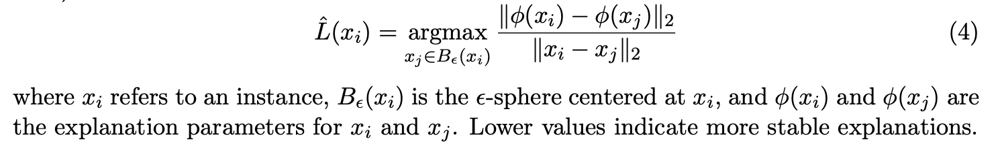


**Compactness Metric**: Measures the number of features needed to explain a certain percentage of the prediction, aiding in understanding model decisions. This can be obtained by fixing the percentage we want to reach and compute the number of features needed to explain that fixed percentage of the prediction.

**Faithfulness Metric (ROAR)**: Involves iteratively removing features, retraining the model, and evaluating changes in accuracy or feature importance, assessing the impact of feature removal on model performance.


  ### **Implementation code**

  The evaluation metrics are implemented using Python libraries such as scikit-learn and SHAP.

For the Consistency Metric, L2 distance computation between pairs of explanations can be achieved using numpy.

The Stability Metric can be implemented by comparing explanations for instances with similar feature values and predictions using scikit-learn.

The Compactness Metric can be calculated by fixing a percentage of the prediction and computing the number of features needed to explain that percentage using pandas and numpy.

The Faithfulness Metric (ROAR) can be implemented by iteratively removing features, retraining the model, and evaluating changes in accuracy or feature importance using scikit-learn and pandas.



# Explainable AI (XAI)


In [69]:
risk_factor_df.columns

Index(['Age', 'Number of sexual partners', 'First sexual intercourse',
       'Num of pregnancies', 'Smokes', 'Smokes (years)', 'Smokes (packs/year)',
       'Hormonal Contraceptives', 'Hormonal Contraceptives (years)', 'IUD',
       'IUD (years)', 'STDs', 'STDs (number)', 'STDs:condylomatosis',
       'STDs:cervical condylomatosis', 'STDs:vaginal condylomatosis',
       'STDs:vulvo-perineal condylomatosis', 'STDs:syphilis',
       'STDs:pelvic inflammatory disease', 'STDs:genital herpes',
       'STDs:molluscum contagiosum', 'STDs:AIDS', 'STDs:HIV',
       'STDs:Hepatitis B', 'STDs:HPV', 'STDs: Number of diagnosis',
       'STDs: Time since first diagnosis', 'STDs: Time since last diagnosis',
       'Dx:CIN', 'Dx:HPV', 'Dx', 'Hinselmann', 'Schiller', 'Citology',
       'Biopsy', 'total_std', 'total_tests', 'Dx:Cancer', 'age_cat'],
      dtype='object')

In [70]:
risk_factor_df=pd.read_csv('risk_factors_cervical_cancer.csv')

In [71]:
X_test=pd.read_csv('X_test.csv')
X_test.drop('Unnamed: 0', inplace=True, axis=1)
y_test=pd.read_csv('y_test.csv')
y_test.drop('Unnamed: 0', inplace=True, axis=1)
X_train=pd.read_csv('X_train.csv')
X_train.drop('Unnamed: 0', inplace=True, axis=1)
y_train=pd.read_csv('y_train.csv')
y_train.drop('Unnamed: 0', inplace=True, axis=1)

### Model

In [72]:
rnd_clf = RandomForestClassifier()
rnd_clf.fit(X_train, y_train)
rnd_clf.score(X_train, y_train)

1.0

In [73]:
nn_clf = MLPClassifier()
nn_clf.fit(X_train, y_train)
nn_clf.score(X_train, y_train)

0.9992542878448919

In [74]:
nn_clf.score(X_test, y_test)

0.9970238095238095

In [75]:
model=rnd_clf

## Local methods

### Generate local FI

In [76]:
!pip install shap
!pip install lime
!pip install interpret-community
!pip install alibi
!pip install treeinterpreter
!pip install SALib
!pip install dice-ml
!pip install pip install spectralcluster
!pip install -U kaleido

In [77]:
from sklearn.inspection import permutation_importance
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import PartialDependenceDisplay, partial_dependence
from interpret_community.mimic.mimic_explainer import MimicExplainer
from interpret_community.mimic.models import LinearExplainableModel
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from interpret.blackbox import MorrisSensitivity
import shap
import lime
from lime import lime_tabular
from treeinterpreter import treeinterpreter as ti

import pandas as pd
import numpy as np
from numpy import arange
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

import random


Could not import lightgbm, required if using LGBMExplainableModel


#### Tools

In [78]:
GloSur=kernelSHAP=treeSHAP=samplingSHAP=limecontrib=ticontrib=dicecontrib=pd.DataFrame([[0.0]*X_test.shape[1]]*X_test.shape[0], columns=X_test.columns)
fi_1=fi_2=fi_3=fi_4=fi_5=fi_6=fi_7={f'{x}':0.0 for x in X_test.columns}

#model = nn_clf
model = rnd_clf
res = dict()
features=X_test.columns

In [79]:
print("-GLOSUR-")
# GloSur
explainer = MimicExplainer(model,
                          X_train,
                          LinearExplainableModel,
                          augment_data=False,
                          features=features, 
                          model_task="classification")
global_explanation = explainer.explain_global(X_test)
temp=pd.DataFrame(global_explanation.local_importance_values[1], columns=features)
GloSur=GloSur.add(temp, fill_value=0)


res = dict()
res = global_explanation.get_feature_importance_dict()
fi_1={k: fi_1.get(k, 0) + res.get(k, 0) for k in set(fi_1)}


-GLOSUR-


In [80]:
print("-KSHAP-")
# KSHAP
K=10
explainer = shap.KernelExplainer(model.predict_proba, X_train)
#shap_values = explainer.shap_values(X_test)
shap_values = explainer.shap_values(shap.sample(X_test, K))
temp=pd.DataFrame(shap_values[1], columns=features)
kernelSHAP=kernelSHAP.add(temp, fill_value=0)

res = dict()
for i in list(kernelSHAP.columns):
  res[i]=np.mean(np.abs(kernelSHAP[i]))
fi_2={k: fi_2.get(k, 0) + res.get(k, 0) for k in set(fi_2)}

Using 1341 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


-KSHAP-


  0%|          | 0/10 [00:00<?, ?it/s]

#### Currently running the explainable models on undersampled data with k=10 for final submisssion we shall keep it same as the original project and save the pretrained model and then use it for evaluation

In [ ]:
#`explainer.save()

In [81]:
print("-TSHAP-")
# # TSHAP
K=10
explainer = shap.TreeExplainer(model,X_train)
#shap_values = explainer.shap_values(X_test)
shap_values = explainer.shap_values(shap.sample(X_test, K))

temp=pd.DataFrame(shap_values[1], columns=features)
treeSHAP=treeSHAP.add(temp, fill_value=0)

res = dict()
for i in list(treeSHAP.columns):
   res[i]=np.mean(np.abs(treeSHAP[i]))
fi_3={k: fi_3.get(k, 0) + res.get(k, 0) for k in set(fi_3)}

-TSHAP-


In [82]:
print("-SSHAP-")
# SSHAP
K=10
explainer = shap.explainers.Sampling(model.predict_proba, X_train)
#shap_values = explainer.shap_values(X_test)
shap_values = explainer.shap_values(shap.sample(X_test, K))
temp=pd.DataFrame(shap_values[1], columns=features)
samplingSHAP=samplingSHAP.add(temp, fill_value=0)

res = dict()
for i in list(samplingSHAP.columns):
  res[i]=np.mean(np.abs(samplingSHAP[i]))
fi_4={k: fi_4.get(k, 0) + res.get(k, 0) for k in set(fi_4)}


-SSHAP-


  0%|          | 0/10 [00:00<?, ?it/s]

In [83]:
print("-LIME-")

# LIME
K=10
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,mode='classification',feature_names=X_test.columns)

all=[]
for i in range (len(X_test)):
  #exp = explainer.explain_instance(X_test.iloc[i], model.predict_proba, num_features=X_test.shape[1])
  exp = explainer.explain_instance(X_test.iloc[i], model.predict_proba, num_features=K,num_samples=K)
  all.append(sorted(exp.as_map()[1]))


all_res=[]
for i in range(len(all)):
  res = dict()
  for j in range(len(all[0])):
    res[features[j]] = all[i][j][1]
  all_res.append(res)

temp=pd.DataFrame(all_res, columns=features)
limecontrib=limecontrib.add(temp, fill_value=0)

res = dict()
for j in list(limecontrib.columns):
  res[j]=np.mean(np.abs(limecontrib[j]))
fi_5={k: fi_5.get(k, 0) + res.get(k, 0) for k in set(fi_5)}

-LIME-


In [84]:
print("-TI-")
# # TI
prediction, bias, contributions = ti.predict(model, X_test)

all_res=[]
for i in range(len(contributions)):
   res = dict()
   for j in range(len(features)):
     res[features[j]] = contributions[i][j][1]
   all_res.append(res)

temp=pd.DataFrame(all_res, columns=features)
ticontrib=ticontrib.add(temp, fill_value=0)

res = dict()
for j in list(ticontrib.columns):
  res[j]=np.mean(np.abs(ticontrib[j]))
fi_6={k: fi_6.get(k, 0) + res.get(k, 0) for k in set(fi_6)}

-TI-


In [ ]:
#df.select_dtypes(exclude=int)

In [85]:
label = "Dx:Cancer"

In [86]:
temp1=X_train
temp1['Dx:Cancer']=y_train
temp2=X_test
temp2['Dx:Cancer']=y_test
temp3=pd.concat([temp1,temp2])

risk_factor_df_test=temp3

In [87]:
#these columns are not of type object, but are of type numeric
cols_to_convert = ['Number of sexual partners', 'First sexual intercourse', 'Num of pregnancies', 'Smokes',
                   'Smokes (years)', 'Smokes (packs/year)', 'Hormonal Contraceptives',
                   'Hormonal Contraceptives (years)', 'IUD', 'IUD (years)', 'STDs', 'STDs (number)',
                   'STDs:condylomatosis', 'STDs:cervical condylomatosis', 'STDs:vaginal condylomatosis',
                   'STDs:vulvo-perineal condylomatosis', 'STDs:syphilis', 'STDs:pelvic inflammatory disease',
                   'STDs:genital herpes', 'STDs:molluscum contagiosum', 'STDs:AIDS', 'STDs:HIV', 'STDs:Hepatitis B',
                   'STDs:HPV', 'STDs: Time since first diagnosis',
                   'STDs: Time since last diagnosis']
# for i in range(0,len(cols_to_convert)):
#     print("{}={}".format(i,cols_to_convert[i]))
risk_factor_df[cols_to_convert] = risk_factor_df[cols_to_convert].apply(pd.to_numeric, errors="coerce")
risk_factor_df[cols_to_convert].fillna(np.nan, inplace=True)
imp = SimpleImputer(strategy="median")
X = imp.fit_transform(risk_factor_df)
risk_factor_df = pd.DataFrame(X, columns=list(risk_factor_df.columns))

In [88]:
def age_cat(age):
    if age < 12:
        return "Child"
    elif age < 20:
        return "Teen"
    elif age < 30:
        return "20's"
    elif age < 40:
        return "30's"
    elif age < 50:
        return "40's"
    elif age < 60:
        return "50's"
    elif age < 70:
        return "60's"
    else:
        return "70+"


risk_factor_df["Age"] = risk_factor_df["Age"].astype(int)
risk_factor_df["age_cat"] = risk_factor_df["Age"].apply(age_cat)

In [89]:
std_cols = {'STDs:condylomatosis',
            'STDs:cervical condylomatosis',
            'STDs:vaginal condylomatosis',
            'STDs:vulvo-perineal condylomatosis',
            'STDs:syphilis',
            'STDs:pelvic inflammatory disease',
            'STDs:genital herpes',
            'STDs:molluscum contagiosum',
            'STDs:AIDS',
            'STDs:HIV',
            'STDs:Hepatitis B',
            'STDs:HPV'}

risk_factor_df["total_std"] = risk_factor_df[list(std_cols)].sum(axis=1)
std_agg = risk_factor_df.groupby("age_cat", as_index=False)[list(std_cols)].sum()

In [90]:
test_cols = ["Hinselmann", "Schiller", "Citology", "Biopsy"]
risk_factor_df["total_tests"] = risk_factor_df[test_cols].sum(axis = 1)

In [91]:
print("-DICE-")
import dice_ml

to_int_and_beyond = to_int_and_beyond.union(std_cols)
#print(to_int_and_beyond,risk_factor_df.columns)
for col in to_int_and_beyond:
    risk_factor_df[col] = risk_factor_df[col].astype(int)
df=risk_factor_df.drop(['total_std', 'age_cat', 'total_tests'],axis=1)

#print(list(X_test.columns),list(df.columns),X_test.head(),df.head())
#feature_names = [            name for name in df.columns.tolist() if name != label]

#number_of_features = len(feature_names)
#print(len(set(list(X_test.columns)))-number_of_features)

#print(list(X_test.columns),feature_names)
cont_feat = list(X_test.columns)
cont_feat.remove(label)

#print(cont_feat)

d = dice_ml.Data(dataframe=df, continuous_features=cont_feat, outcome_name=label)
#d = dice_ml.Data(dataframe=df, continuous_features=['Age','smokes'], outcome_name=label)
m = dice_ml.Model(model=model, backend="sklearn")

exp = dice_ml.Dice(d, m, method="random")
query_instance = X_test.drop(label,axis=1)
e1 = exp.generate_counterfactuals(query_instance, total_CFs=10, desired_range=None,
                                  desired_class="opposite",
                                  permitted_range=None, features_to_vary="all")

imp = exp.local_feature_importance(query_instance, posthoc_sparsity_param=None)
dicecontrib=pd.DataFrame.from_dict(imp.local_importance)

res = dict()
for j in list(dicecontrib.columns):
  res[j]=np.mean(np.abs(dicecontrib[j]))
fi_7={k: fi_7.get(k, 0) + res.get(k, 0) for k in set(fi_7)}

-DICE-


100%|██████████| 336/336 [00:45<00:00,  7.40it/s]


In [92]:
GloSur.to_csv("glosur.csv", index=False) 
kernelSHAP.to_csv("Kshap.csv", index=False)  
treeSHAP.to_csv("Tshap.csv", index=False) 
samplingSHAP.to_csv("Sshap.csv", index=False) 
limecontrib.to_csv("lime.csv", index=False)  
ticontrib.to_csv("ti.csv", index=False)
dicecontrib.to_csv("dice.csv", index=False)

In [93]:
dics = []

fi_1['Method'] = 'Surrogates'
dics.append(fi_1)
fi_2['Method'] = 'KSHAP'
dics.append(fi_2)
fi_3['Method'] = 'TSHAP'
dics.append(fi_3)
fi_4['Method'] = 'SSHAP'
dics.append(fi_4)
fi_5['Method'] = 'LIME'
dics.append(fi_5)
fi_6['Method'] = 'TI'
dics.append(fi_6)
fi_7['Method'] = 'DICE'
dics.append(fi_7)


dics = pd.DataFrame(dics)
methods=dics['Method']
dics['Method']=methods
dics.to_csv("toutfi.csv", index=False)

### Get explanations

In [94]:
instance=291

In [108]:
gscontrib=pd.read_csv('glosur.csv')
kercontrib=pd.read_csv('Kshap.csv')
samcontrib=pd.read_csv('Sshap.csv')
trecontrib=pd.read_csv('Tshap.csv')
limecontrib=pd.read_csv('lime.csv')
ticontrib=pd.read_csv('ti.csv')
dicecontrib=pd.read_csv('dice.csv')
all_fi=pd.read_csv('toutfi.csv')

#### TOOLS

In [109]:
all_fi.fillna(0, inplace=True)
all_fi.iloc[:,:-1]=np.abs(all_fi.iloc[:,:-1])
all_fi.reset_index(drop=True, inplace=True)

In [110]:
label="Dx:Cancer"

In [111]:
methods=all_fi['Method'].to_list()
weights=[gscontrib, kercontrib, samcontrib, limecontrib, dicecontrib]

In [112]:
methods=all_fi['Method'].to_list()
weights=[gscontrib, kercontrib, trecontrib, samcontrib, limecontrib, ticontrib, dicecontrib]

#### Normalize ?

In [113]:
gscontrib_norm=gscontrib.div(gscontrib.sum(axis=1), axis=0)
kercontrib_norm=kercontrib.div(kercontrib.sum(axis=1), axis=0)
samcontrib_norm=samcontrib.div(samcontrib.sum(axis=1), axis=0)
trecontrib_norm=trecontrib.div(trecontrib.sum(axis=1), axis=0)
limecontrib_norm=limecontrib.div(limecontrib.sum(axis=1), axis=0)
ticontrib_norm=ticontrib.div(ticontrib.sum(axis=1), axis=0)
dicecontrib_norm=dicecontrib.div(dicecontrib.sum(axis=1), axis=0)

### One instance

In [114]:
risk_factor_df.describe().iloc[1]

Age                                   26.820513
Number of sexual partners              2.511655
First sexual intercourse              16.995338
Num of pregnancies                     2.257576
Smokes                                 0.143357
Smokes (years)                         1.201241
Smokes (packs/year)                    0.446278
Hormonal Contraceptives                0.686480
Hormonal Contraceptives (years)        2.035331
IUD                                    0.096737
IUD (years)                            0.444604
STDs                                   0.092075
STDs (number)                          0.155012
STDs:condylomatosis                    0.051282
STDs:cervical condylomatosis           0.000000
STDs:vaginal condylomatosis            0.004662
STDs:vulvo-perineal condylomatosis     0.050117
STDs:syphilis                          0.020979
STDs:pelvic inflammatory disease       0.001166
STDs:genital herpes                    0.001166
STDs:molluscum contagiosum             0

In [115]:
xx=risk_factor_df.describe().iloc[1]

In [116]:
instance=3

In [117]:
xx=X_test.iloc[instance]

In [118]:
idx=list(xx.to_numpy().nonzero()[0])

In [119]:
xx=xx.to_frame()
xxx=xx.T.columns
new=pd.DataFrame()
for i in range(len(xxx)):
  if i in idx:
    new[xxx[i]]=xx.T[xxx[i]]


In [120]:
new.T.round(2)

,3
Age,27.0
Number of sexual partners,2.0
First sexual intercourse,19.0
Num of pregnancies,2.0
Hormonal Contraceptives,1.0
Hormonal Contraceptives (years),7.0
STDs: Time since first diagnosis,4.0
STDs: Time since last diagnosis,3.0


In [121]:
with open('instance.tex','w') as tf:
    tf.write(new.T.round(2).to_latex())

#### Instance datafame

In [122]:
one_instance=[]

for i in range(len(methods)):
  one_instance.append(weights[i].iloc[instance])

one_instance=pd.DataFrame(one_instance, columns=X_test.columns)
one_instance['methods']=methods
one_instance.set_index('methods', inplace=True)

#one_instance.to_csv('/content/drive/My Drive/dataXAI/cancer/sonali/one_instance.csv')
one_instance.to_csv('one_instance.csv')

In [123]:
'methods' in one_instance.columns

False

In [124]:
one_instance

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs: Time since first diagnosis,STDs: Time since last diagnosis,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy,Dx:Cancer
methods,,,,,,,,,,,,,,,,,,,,,
Surrogates,-0.577479,0.022478,-0.072637,0.225956,0.103075,-0.770214,0.091572,-0.040132,0.371374,0.000000,...,-0.007662,0.135977,0.000000,-3.064996,-1.331968,0.000000,0.000000,0.000000,0.000000,NaN
KSHAP,-0.027786,-0.002080,-0.031385,-0.006510,0.002425,-0.004518,-0.001919,0.021702,-0.049507,0.003693,...,0.000000,-0.000250,0.000000,-0.212475,-0.132767,0.000000,-0.002915,-0.000867,-0.005914,NaN
TSHAP,-0.034747,-0.002832,-0.031672,-0.007740,0.002027,-0.006145,-0.004058,0.024238,-0.054426,0.004234,...,-0.000246,-0.000316,0.000000,-0.223386,-0.120295,0.000060,-0.004243,-0.002666,-0.006617,NaN
SSHAP,-0.028495,-0.000498,-0.030409,-0.001975,0.001073,-0.005455,-0.003011,0.020588,-0.050580,0.002857,...,-0.000400,-0.000686,0.001098,-0.210140,-0.130310,0.000200,-0.004162,-0.003265,-0.006661,NaN
LIME,-0.059364,-0.098501,-0.048311,-0.063018,0.062236,-0.322151,-0.147068,-0.021814,-0.021814,-0.053602,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
TI,0.032595,-0.001414,0.046709,0.006338,0.005372,-0.018341,-0.018237,-0.017701,0.035461,-0.012274,...,-0.000499,-0.000587,0.000000,-0.281522,-0.183681,0.000053,-0.004546,-0.003023,-0.001351,NaN
DICE,0.000000,0.300000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.100000,0.100000,0.000000,0.500000,0.500000,0.000000,0.000000,0.000000,0.000000,NaN


### Plot FI for one instance 

In [125]:
X_test=pd.read_csv('X_test.csv')
X_test.drop('Unnamed: 0', inplace=True, axis=1)
y_test=pd.read_csv('y_test.csv')
y_test.drop('Unnamed: 0', inplace=True, axis=1)
X_train=pd.read_csv('X_train.csv')
X_train.drop('Unnamed: 0', inplace=True, axis=1)
y_train=pd.read_csv('y_train.csv')
y_train.drop('Unnamed: 0', inplace=True, axis=1)

In [126]:
instance=291
var='W'
maxx=10
f=''
#vale=0

In [ ]:
# tempt=X_test.iloc[291]
# tempt[f]=vale
# #tempt["Age"]=1
# #tempt["Num of pregnancies"]=120
# #tempt["Smokes"]=200
# tempt
# X_test.iloc[291]=tempt
# X_test.iloc[291]

In [127]:
model.predict(X_test)

array([1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0,
       0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1,
       1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1,
       1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1,
       0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1,
       1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0,
       0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0,

In [128]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,mode='classification',feature_names=X_test.columns)
exp = explainer.explain_instance(X_test.iloc[instance], model.predict_proba, num_features=X_test.shape[1]) 

In [129]:
items = gscontrib.iloc[instance].to_dict()
t = []
count=0
for i, item in enumerate(items):
  if abs(items[item]) > 0.0 : 
    t.append((i, items[item]))

t = sorted(t, key=lambda tup: abs(tup[1]),  reverse=True)

exp_test = {1: t[0:maxx]}


exp.local_exp = exp_test
exp.show_in_notebook(show_table=False,show_predicted_value=False)

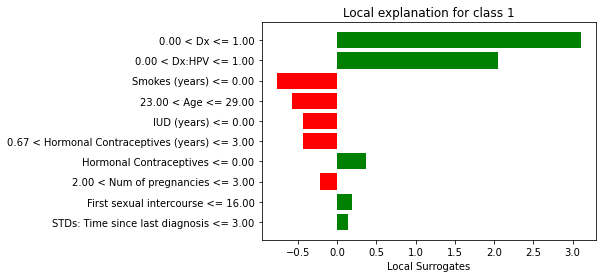

In [130]:
%matplotlib inline
fig = exp.as_pyplot_figure()
plt.xlabel("Local Surrogates")
#fig.savefig('/content/drive/My Drive/dataXAI/cancer/'+str(var)+'surrogate'+str(instance)+str(f)+'.png', bbox_inches='tight')
fig.savefig(''+str(var)+'surrogate'+str(instance)+str(f)+'.png', bbox_inches='tight')

In [131]:
items = kercontrib.iloc[instance].to_dict()
t = []
count=0
for i, item in enumerate(items):
  if abs(items[item]) > 0.0 : 
    t.append((i, items[item]))

t = sorted(t, key=lambda tup: abs(tup[1]),  reverse=True)

exp_test = {1: t[0:maxx]}


exp.local_exp = exp_test
exp.show_in_notebook(show_table=False,show_predicted_value=False)

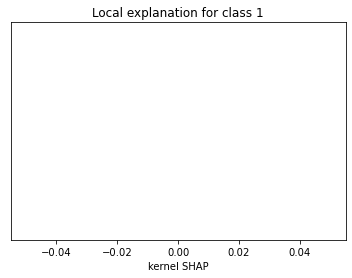

In [132]:
%matplotlib inline
fig = exp.as_pyplot_figure()
plt.xlabel("kernel SHAP")
#fig.savefig('/content/drive/My Drive/dataXAI/cancer/'+str(var)+'kernelSHAP'+str(instance)+str(f)+'.png', bbox_inches='tight')
fig.savefig(''+str(var)+'kernelSHAP'+str(instance)+str(f)+'.png', bbox_inches='tight')

In [133]:
items = trecontrib.iloc[instance].to_dict()
t = []
count=0
for i, item in enumerate(items):
  if abs(items[item]) > 0.0 : 
    t.append((i, items[item]))

t = sorted(t, key=lambda tup: abs(tup[1]),  reverse=True)

exp_test = {1: t[0:maxx]}


exp.local_exp = exp_test
exp.show_in_notebook(show_table=True,show_predicted_value=False)

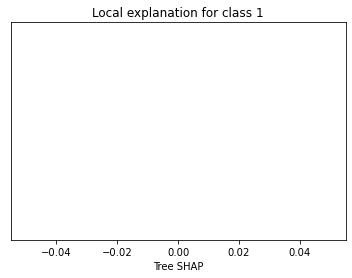

In [134]:
%matplotlib inline
fig = exp.as_pyplot_figure()
plt.xlabel("Tree SHAP")
#fig.savefig('/content/drive/My Drive/dataXAI/cancer/'+str(var)+'treeSHAP'+str(instance)+str(f)+'.png', bbox_inches='tight')
fig.savefig(''+str(var)+'treeSHAP'+str(instance)+str(f)+'.png', bbox_inches='tight')

In [135]:
items = samcontrib.iloc[instance].to_dict()
t = []
count=0
for i, item in enumerate(items):
  if abs(items[item]) > 0.0 : 
    t.append((i, items[item]))

t = sorted(t, key=lambda tup: abs(tup[1]),  reverse=True)

exp_test = {1: t[0:maxx]}


exp.local_exp = exp_test
exp.show_in_notebook(show_table=True,show_predicted_value=False)

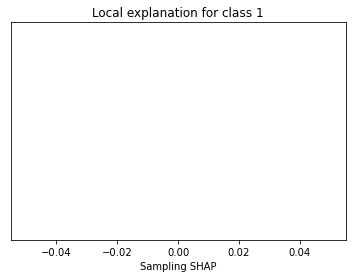

In [136]:
%matplotlib inline
fig = exp.as_pyplot_figure()
plt.xlabel("Sampling SHAP")
#fig.savefig('/content/drive/My Drive/dataXAI/cancer/'+str(var)+'samplingSHAP'+str(instance)+str(f)+'.png', bbox_inches='tight')
fig.savefig(''+str(var)+'samplingSHAP'+str(instance)+str(f)+'.png', bbox_inches='tight')

In [137]:
items = limecontrib.iloc[instance].to_dict()
t = []
count=0
for i, item in enumerate(items):
  if abs(items[item]) > 0.0 : 
    t.append((i, items[item]))

t = sorted(t, key=lambda tup: abs(tup[1]),  reverse=True)

exp_test = {1: t[0:maxx]}


exp.local_exp = exp_test
exp.show_in_notebook(show_table=True,show_predicted_value=False)

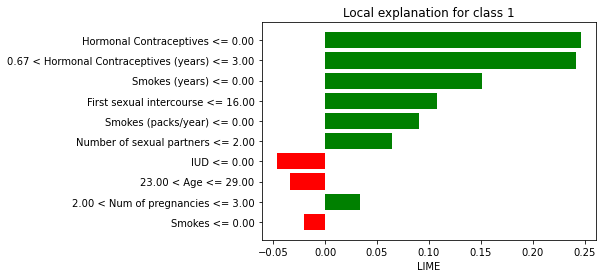

In [138]:
%matplotlib inline
fig = exp.as_pyplot_figure()
plt.xlabel("LIME")
#fig.savefig('/content/drive/My Drive/dataXAI/cancer/'+str(var)+'lime'+str(instance)+str(f)+'.png', bbox_inches='tight')
fig.savefig(''+str(var)+'lime'+str(instance)+str(f)+'.png', bbox_inches='tight')

In [139]:
items = ticontrib.iloc[instance].to_dict()
t = []
count=0
for i, item in enumerate(items):
  if abs(items[item]) > 0.0 : 
    t.append((i, items[item]))

t = sorted(t, key=lambda tup: abs(tup[1]),  reverse=True)

exp_test = {1: t[0:maxx]}


exp.local_exp = exp_test
exp.show_in_notebook(show_table=False,show_predicted_value=False)

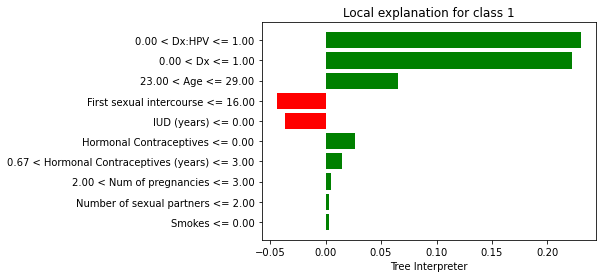

In [140]:
%matplotlib inline
fig = exp.as_pyplot_figure()
plt.xlabel("Tree Interpreter")
#fig.savefig('/content/drive/My Drive/dataXAI/cancer/'+str(var)+'ti'+str(instance)+str(f)+'.png', bbox_inches='tight')
fig.savefig(''+str(var)+'ti'+str(instance)+str(f)+'.png', bbox_inches='tight')

In [141]:
items = dicecontrib.iloc[instance].to_dict()
t = []
count=0
for i, item in enumerate(items):
  if abs(items[item]) > 0.0 : 
    t.append((i, items[item]))

t = sorted(t, key=lambda tup: abs(tup[1]),  reverse=True)

exp_test = {1: t[0:maxx]}


exp.local_exp = exp_test
exp.show_in_notebook(show_table=False,show_predicted_value=False)

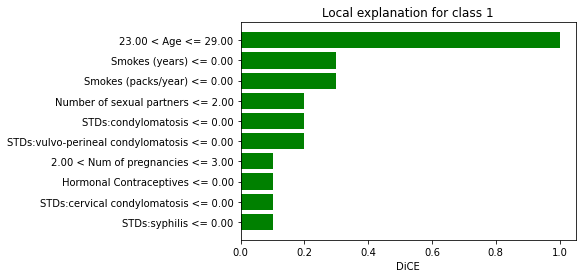

In [142]:
%matplotlib inline
fig = exp.as_pyplot_figure()
plt.xlabel("DiCE")
#fig.savefig('/content/drive/My Drive/dataXAI/cancer/'+str(var)+'dice'+str(instance)+str(f)+'.png', bbox_inches='tight')
fig.savefig(''+str(var)+'dice'+str(instance)+str(f)+'.png', bbox_inches='tight')

### ROAR

In [143]:
from matplotlib import pyplot as plt
from sklearn.model_selection import StratifiedKFold, cross_val_score

def roar(featImp, feature_to_predict, datapath,savepath,dataname): 

  a=['ro--', 'go--', 'mo--', 'yo--', 'co--', 'ko--', 'bo--']
  pourc=[0,10,20,30,40,60,70,90]
  font = {'size'   : 14}

  plt.rc('font', **font)
    
  #print(featImp, feature_to_predict, datapath,savepath,dataname)


  for k in range(featImp.shape[0]):
    accuracies=[]  
    new=[]
    for i in pourc:

      fi= featImp.iloc[k,:]
      fi.drop('Method', inplace=True)
      fi=fi.to_dict()
      fi=dict(sorted(fi.items(), key=lambda x:x[1], reverse=True))
      #print(fi)
      
      fii=list(fi.keys())
      
      df= pd.read_csv(datapath)

      top=int((len(df.columns)*i)/100)
      fii = fii[top:] 
      #print(fii)
      
      #df.drop(fii[0:top], axis=1, inplace=True)  
      new=fii
      new.append(feature_to_predict)
      df=df[new]

      X=np.array(df[list(df.columns.drop(feature_to_predict))])
      y=np.array(df[feature_to_predict])

      model = RandomForestClassifier(random_state = 42)
      
  
      scores = cross_val_score(model, X, y, cv=10)
      accuracies.append(np.mean(scores))

    plt.plot(pourc, accuracies, a[k], label=featImp['Method'][k])

    
  plt.xlabel('% removed features for Cervical cancer risk factors')
  
  
  plt.ylabel('Accuracy')
  plt.legend(loc='upper right')
  plt.savefig(savepath+'roar.png', bbox_inches='tight', dpi=300)
  plt.show()

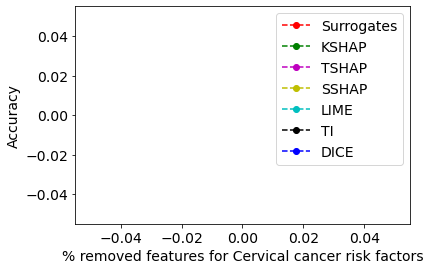

In [144]:
#datapath='/content/drive/My Drive/dataXAI/cancer/cancer.csv'
#savepath= '/content/drive/My Drive/dataXAI/cancer/'
datapath='risk_factors_cervical_cancer.csv'
savepath= ''
dataname='Dx:Cancer'

roar(all_fi, label, datapath, savepath, dataname)

In [145]:
all_fi

,Num of pregnancies,STDs:molluscum contagiosum,STDs:genital herpes,Smokes (years),Citology,Hinselmann,IUD,STDs (number),STDs:AIDS,STDs:vaginal condylomatosis,...,STDs,STDs:syphilis,Biopsy,STDs:condylomatosis,Hormonal Contraceptives,Schiller,First sexual intercourse,Smokes,Dx:CIN,Method
0,0.464016,0.000000,0.000000,0.772623,0.026651,0.025390,0.008651,0.000961,0.0,0.000000e+00,...,0.001182,0.005062,0.000167,0.003741,0.180592,0.018318,0.083538,0.164429,0.017141,Surrogates
1,0.000188,0.000006,0.000001,0.000169,0.000031,0.000002,0.000149,0.000022,0.0,7.311890e-07,...,0.000031,0.000006,0.000076,0.000006,0.000703,0.000052,0.000493,0.000288,0.000011,KSHAP
2,0.000200,0.000000,0.000000,0.000212,0.000033,0.000003,0.000145,0.000013,0.0,0.000000e+00,...,0.000013,0.000000,0.000094,0.000008,0.000603,0.000061,0.000483,0.000303,0.000000,TSHAP
3,0.000172,0.000000,0.000000,0.000190,0.000034,0.000004,0.000146,0.000040,0.0,0.000000e+00,...,0.000035,0.000002,0.000094,0.000010,0.000716,0.000056,0.000470,0.000284,0.000019,SSHAP
4,0.073179,0.000000,0.000000,0.086972,0.000000,0.000000,0.090673,0.000000,0.0,0.000000e+00,...,0.000000,0.000000,0.000000,0.000000,0.160358,0.000000,0.071660,0.079805,0.000000,LIME
5,0.007718,0.000000,0.000000,0.008030,0.002634,0.000588,0.007421,0.003537,0.0,0.000000e+00,...,0.003704,0.000342,0.002629,0.001367,0.017668,0.003018,0.038205,0.009351,0.001883,TI
6,0.060714,0.031548,0.022321,0.061310,0.027083,0.022321,0.025595,0.059226,0.0,2.857143e-02,...,0.033036,0.023810,0.027083,0.028571,0.047024,0.026786,0.072619,0.045536,0.070536,DICE


### SHAPASH

https://towardsdatascience.com/building-confidence-on-explainability-methods-66b9ee575514

In [146]:
!pip install shapash

In [147]:
from shapash.explainer.consistency import Consistency
from shapash import SmartExplainer

In [148]:
from shapash.explainer.consistency import Consistency
from shapash import SmartExplainer
cns=Consistency()
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test)

INFO: Shap explainer type - <shap.explainers._tree.TreeExplainer object at 0x000002C34F104700>


##### Contribution plots

In [149]:
img=xpl.plot.contribution_plot(0)

In [ ]:
#img.write_image('contribage.png')

In [150]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test,contributions=kercontrib)

In [151]:
img=xpl.plot.contribution_plot(0)

In [ ]:
#img.write_image('/content/drive/My Drive/dataXAI/cancer/contribagekernel.png')

In [152]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test,contributions=samcontrib)
img=xpl.plot.contribution_plot(0)

In [ ]:
#img.write_image('/content/drive/My Drive/dataXAI/cancer/contribagesampling.png')

In [153]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test,contributions=trecontrib)
img=xpl.plot.contribution_plot(0)

In [ ]:
#img.write_image('/content/drive/My Drive/dataXAI/cancer/contribagetree.png')

In [154]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test,contributions=limecontrib)
img=xpl.plot.contribution_plot(0)

In [ ]:
#img.write_image('/content/drive/My Drive/dataXAI/cancer/contribagelime.png')

In [155]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test,contributions=ticontrib)
img=xpl.plot.contribution_plot(0)

In [ ]:
#img.write_image('/content/drive/My Drive/dataXAI/cancer/contribageti.png')

In [156]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test,contributions=gscontrib)
img=xpl.plot.contribution_plot(0)

In [ ]:
#img.write_image('/content/drive/My Drive/dataXAI/cancer/contribagegs.png')

In [158]:
#xpl = SmartExplainer(model=model)
#xpl.compile(x=X_test,contributions=dicecontrib)
#xpl.plot.contribution_plot(0)

#### Contributions plot

In [200]:
#fig_image=xpl.plot.contribution_plot(0)
#plt.savefig('age.png')

In [ ]:
#fig_image=xpl.plot.contribution_plot(0)
#plt.savefig('/content/drive/My Drive/dataXAI/cancer/sonali/age.png')

<Figure size 640x480 with 0 Axes>

In [ ]:
#fig_image=xpl.plot.contribution_plot(29)
#plt.savefig('/content/drive/My Drive/dataXAI/cancer/sonali/dxhpv.png')

<Figure size 640x480 with 0 Axes>

In [ ]:
#fig_image=xpl.plot.contribution_plot(30)
#plt.savefig('/content/drive/My Drive/dataXAI/cancer/sonali/dxhpv.png')

<Figure size 640x480 with 0 Axes>

#### Consistency

In [160]:
pairwise_consistency=cns.calculate_all_distances(methods, weights)

In [161]:
test=pairwise_consistency[1].round(2)

In [162]:
test.style.background_gradient(cmap='Paired_r')

,Surrogates,KSHAP,TSHAP,SSHAP,LIME,TI,DICE
Surrogates,0.000000,nan,nan,nan,1.400000,0.470000,1.380000
KSHAP,nan,0.000000,nan,nan,nan,nan,nan
TSHAP,nan,nan,0.000000,nan,nan,nan,nan
SSHAP,nan,nan,nan,0.000000,nan,nan,nan
LIME,1.400000,nan,nan,nan,0.000000,1.360000,1.410000
TI,0.470000,nan,nan,nan,1.360000,0.000000,1.270000
DICE,1.380000,nan,nan,nan,1.410000,1.270000,0.000000


In [163]:
with open('consistency.tex','w') as tf:
    tf.write(test.to_latex())

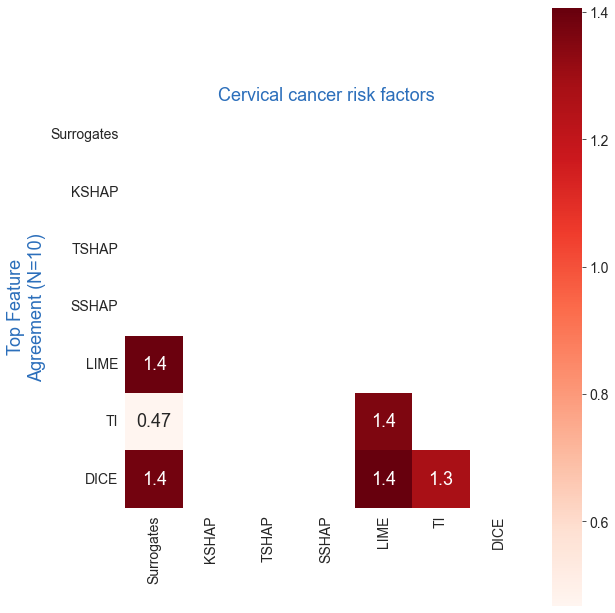

In [164]:
corr = pairwise_consistency[1]
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig = plt.figure(figsize=(9, 11))
with sns.axes_style("white"):
  
    ax = sns.heatmap(corr, mask=mask, square=True,annot=True, annot_kws={'fontsize': 18}, 
                xticklabels=methods, yticklabels=methods, cmap="Reds", cbar=True)
    ax.set_title("Cervical cancer risk factors", color='xkcd:medium blue', fontsize=18)
    ax.set_ylabel('Top Feature\nAgreement (N=10)', color='xkcd:medium blue', fontsize=18)
   
    
 
    plt.show()


In [165]:
fig.savefig('consistency.png', bbox_inches='tight', dpi=300)

Mean Consistency

In [166]:
for i in pairwise_consistency[1].columns:
  print(i, round(np.mean(pairwise_consistency[1][i]),2))

Surrogates 0.81
KSHAP 0.0
TSHAP 0.0
SSHAP 0.0
LIME 1.04
TI 0.78
DICE 1.02


#### Compactness

In [167]:
def get_distance(selection, contributions, mode, nb_features):
    
    if mode == "classification" and len(contributions) == 2:
        contributions = contributions[1]
    assert nb_features <= contributions.shape[1]

    contributions = contributions.loc[selection].values
    top_features = np.array([sorted(row, key=abs, reverse=True) for row in contributions])[:, :nb_features]
    output_top_features = np.sum(top_features[:, :], axis=1)
    output_all_features = np.sum(contributions[:, :], axis=1)

    if mode == "regression":
        distance = abs(output_top_features - output_all_features) / abs(output_all_features)
    elif mode == "classification":
        distance = abs(output_top_features - output_all_features)
    return distance
 
 
def get_min_nb_features(selection, contributions, mode, distance):
    
    assert 0 <= distance <= 1

    if mode == "classification" and len(contributions) == 2:
        contributions = contributions[1]
    contributions = contributions.loc[selection].values
    features_needed = []
    # For each instance, add features one by one (ordered by SHAP) until we get close enough
    for i in range(contributions.shape[0]):
        ids = np.flip(np.argsort(np.abs(contributions[i, :])))
        output_value = np.sum(contributions[i, :])

        score = 0
        for j, idx in enumerate(ids):
            # j : number of features needed
            # idx : positions of the j top shap values
            score += contributions[i, idx]
            # CLOSE_ENOUGH
            if mode == "regression":
                if abs(score - output_value) < distance * abs(output_value):
                    break
            elif mode == "classification":
                if abs(score - output_value) < distance:
                    break
        features_needed.append(j + 1)
    return features_needed
 
 
 
def compute_features_compacity(case, contributions, selection, distance, nb_features):
        #if (case == "classification") and (len(classes) > 2):
        #    raise AssertionError("Multi-class classification is not supported")

        features_needed = get_min_nb_features(selection, contributions, case, distance)
        distance_reached = get_distance(selection, contributions, case, nb_features)
        # We clip large approximations to 100%
        distance_reached = np.clip(distance_reached, 0, 1)

        return {"features_needed": features_needed, "distance_reached": distance_reached}

In [168]:
compacities=[]

for weight in weights:
  rr=compute_features_compacity(case="classification", contributions=weight, selection=list(range(0, len(X_test))), distance=.9, nb_features=5)
  #rr=compute_features_compacity(case="classification", contributions=weight, selection=[instance], distance=0.9, nb_features=5)
  compacities.append(pd.DataFrame.from_dict(rr))

In [169]:
maxx=[]
for c in compacities:
  maxx.append(c.iloc[c.distance_reached.idxmax()].tolist())
compacity=pd.DataFrame(data=maxx, columns=['features_needed', 'distance_reached'])
compacity['Method']=methods
compacity.set_index('Method', drop=True).round(2)

,features_needed,distance_reached
Method,,
Surrogates,4.0,1.00
KSHAP,1.0,0.07
TSHAP,1.0,0.06
SSHAP,1.0,0.07
LIME,1.0,0.41
TI,1.0,0.22
DICE,8.0,1.00


In [170]:
with open('compactness'+str(instance)+'.tex','w') as tf:
    tf.write(compacity.to_latex())

In [171]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test,contributions=gscontrib)
xpl.plot.compacity_plot

<bound method SmartPlotter.compacity_plot of <shapash.explainer.smart_plotter.SmartPlotter object at 0x000002C351825760>>

##### Plots

In [172]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test,contributions=gscontrib)
img=xpl.plot.compacity_plot()

In [173]:
img

In [ ]:
#img.write_image('/content/drive/My Drive/dataXAI/cancer/'+str(var)+'compactgs.png')

In [174]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test,contributions=kercontrib)
img=xpl.plot.compacity_plot()

In [ ]:
#img.write_image('/content/drive/My Drive/dataXAI/cancer/'+str(var)+'compactkernel.png')

In [175]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test,contributions=trecontrib)
img=xpl.plot.compacity_plot()

In [ ]:
#img.write_image('/content/drive/My Drive/dataXAI/cancer/'+str(var)+'compacttree.png')

In [176]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test,contributions=samcontrib)
img=xpl.plot.compacity_plot()

In [ ]:
#img.write_image('/content/drive/My Drive/dataXAI/cancer/'+str(var)+'compactsampling.png')

In [177]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test,contributions=limecontrib)
img=xpl.plot.compacity_plot()

In [ ]:
#img.write_image('/content/drive/My Drive/dataXAI/cancer/'+str(var)+'compactlime.png')

In [178]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test,contributions=ticontrib)
img=xpl.plot.compacity_plot()

In [ ]:
#img.write_image('/content/drive/My Drive/dataXAI/cancer/'+str(var)+'compactti.png')

In [180]:
#xpl = SmartExplainer(model=model)
#xpl.compile(x=X_test,contributions=dicecontrib)
#xpl.plot.compacity_plot()

#### Stability

##### tool

In [181]:
from sklearn.preprocessing import normalize


def _compute_distance(x1, x2, mean_vector, epsilon=0.0000001):
    """
    Compute distances between data points by using L1 on normalized data : sum(abs(x1-x2)/(mean_vector+epsilon))
    Parameters
    ----------
    x1 : array
        First vector
    x2 : array
        Second vector
    mean_vector : array
        Each value of this vector is the std.dev for each feature in dataset
    Returns
    -------
    diff : float
        Returns :math:`\\sum(\\frac{|x1-x2|}{mean\_vector+epsilon})`
    """
    diff = np.sum(np.abs(x1 - x2) / (mean_vector + epsilon))
    return diff


def _compute_similarities(instance, dataset):
    """
    Compute pairwise distances between an instance and all other data points
    Parameters
    ----------
    instance : 1D array
        Reference data point
    dataset : 2D array
        Entire dataset used to identify neighbors
    Returns
    -------
    similarity_distance : array
        V[j] == distance between actual instance and instance j
    """
    mean_vector = np.array(dataset, dtype=np.float32).std(axis=0)
    similarity_distance = np.zeros(dataset.shape[0])

    for j in range(0, dataset.shape[0]):
        # Calculate distance between point and instance j
        dist = _compute_distance(instance, dataset[j], mean_vector)
        similarity_distance[j] = dist

    return similarity_distance


def _get_radius(dataset, n_neighbors, sample_size=50, percentile=95):
    """
    Calculate the maximum allowed distance between points to be considered as neighbors
    Parameters
    ----------
    dataset : DataFrame
        Pool to sample from and calculate a radius
    n_neighbors : int
        Maximum number of neighbors considered per instance
    sample_size : int, optional
        Number of data points to sample from dataset, by default 500
    percentile : int, optional
        Percentile used to calculate the distance threshold, by default 95
    Returns
    -------
    radius : float
        Distance threshold
    """
    # Select 500 points max to sample
    size = min([dataset.shape[0], sample_size])
    # Randomly sample points from dataset
    sampled_instances = dataset[np.random.randint(0, dataset.shape[0], size), :]
    # Define normalization vector
    mean_vector = np.array(dataset, dtype=np.float32).std(axis=0)
    # Initialize the similarity matrix
    similarity_distance = np.zeros((size, size))
    # Calculate pairwise distance between instances
    for i in range(size):
        for j in range(i, size):
            dist = _compute_distance(sampled_instances[i], sampled_instances[j], mean_vector)
            similarity_distance[i, j] = dist
            similarity_distance[j, i] = dist
    # Select top n_neighbors
    ordered_X = np.sort(similarity_distance)[:, 1: n_neighbors + 1]
    # Select the value of the distance that captures XX% of all distances (percentile)
    return np.percentile(ordered_X.flatten(), percentile)


def find_neighbors(selection, dataset, model, mode, n_neighbors=30):
    """
    For each instance, select neighbors based on 3 criteria:
    1. First pick top N closest neighbors (L1 Norm + st. dev normalization)
    2. Filter neighbors whose model output is too different from instance (see condition below)
    3. Filter neighbors whose distance is too big compared to a certain threshold
    Parameters
    ----------
    selection : list
        Indices of rows to be displayed on the stability plot
    dataset : DataFrame
        Entire dataset used to identify neighbors
    model : model object
        ML model
    mode : str
        "classification" or "regression"
    n_neighbors : int, optional
        Top N neighbors initially allowed, by default 10
    Returns
    -------
    all_neighbors : list of 2D arrays
        Wrap all instances with corresponding neighbors in a list with length (#instances).
        Each array has shape (#neighbors, #features) where #neighbors includes the instance itself.
    """
    instances = dataset.loc[selection].values

    all_neighbors = np.empty((0, instances.shape[1] + 1), float)
    """Filter 1 : Pick top N closest neighbors"""
    for instance in instances:
        c = _compute_similarities(instance, dataset.values)
        # Pick indices of the closest neighbors (and include instance itself)
        neighbors_indices = np.argsort(c)[: n_neighbors + 1]
        # Return instance with its neighbors
        neighbors = dataset.values[neighbors_indices]
        # Add distance column
        neighbors = np.append(neighbors, c[neighbors_indices].reshape(n_neighbors + 1, 1), axis=1)
        all_neighbors = np.append(all_neighbors, neighbors, axis=0)

    # Calculate predictions for all instances and corresponding neighbors
    if mode == "regression":
        # For XGB it is necessary to add columns in df, otherwise columns mismatch
        predictions = model.predict(pd.DataFrame(all_neighbors[:, :-1], columns=dataset.columns))
    elif mode == "classification":
        predictions = model.predict_proba(pd.DataFrame(all_neighbors[:, :-1], columns=dataset.columns))[:, 1]

    # Add prediction column
    all_neighbors = np.append(all_neighbors, predictions.reshape(all_neighbors.shape[0], 1), axis=1)
    # Split back into original chunks (1 chunck = instance + neighbors)
    all_neighbors = np.split(all_neighbors, instances.shape[0])

    """Filter 2 : neighbors with similar blackbox output"""
    # Remove points if prediction is far away from instance prediction
    if mode == "regression":
        # Trick : use enumerate to allow the modifcation directly on the iterator
        for i, neighbors in enumerate(all_neighbors):
            all_neighbors[i] = neighbors[abs(neighbors[:, -1] - neighbors[0, -1]) < 0.1 * abs(neighbors[0, -1])]
    elif mode == "classification":
        for i, neighbors in enumerate(all_neighbors):
            all_neighbors[i] = neighbors[abs(neighbors[:, -1] - neighbors[0, -1]) < 0.1]

    """Filter 3 : neighbors below a distance threshold"""
    # Remove points if distance is bigger than radius
    radius = _get_radius(dataset.values, n_neighbors)

    for i, neighbors in enumerate(all_neighbors):
        # -2 indicates the distance column
        all_neighbors[i] = neighbors[neighbors[:, -2] < radius]
    return all_neighbors

def shap_neighbors(instance, x_encoded, contributions, mode):
    """
    For an instance and corresponding neighbors, calculate various
    metrics (described below) that are useful to evaluate local stability
    Parameters
    ----------
    instance : 2D array
        Instance + neighbours with corresponding features
    x_encoded : DataFrame
        Entire dataset used to identify neighbors
    contributions : DataFrame
        Calculated contribution values for the dataset
    Returns
    -------
    norm_shap_values : array
        Normalized SHAP values (with corresponding sign) of instance and its neighbors
    average_diff : array
        Variability (stddev / mean) of normalized SHAP values (using L1) across neighbors for each feature
    norm_abs_shap_values[0, :] : array
        Normalized absolute SHAP value of the instance
    """
    # Extract SHAP values for instance and neighbors
    # :-2 indicates that two columns are disregarded : distance to instance and model output
    ind = pd.merge(x_encoded.reset_index(), pd.DataFrame(instance[:, :-2], columns=x_encoded.columns), how='inner')\
        .set_index(x_encoded.index.name if x_encoded.index.name is not None else 'index').index
    # If classification, select contrbutions of one class only
    if mode == "classification" and len(contributions) == 2:
        contributions = contributions[1]
    shap_values = contributions.loc[ind]
    # For neighbors comparison, the sign of SHAP values is taken into account
    norm_shap_values = normalize(shap_values, axis=1, norm="l1")
    # But not for the average impact of the features across the dataset
    norm_abs_shap_values = normalize(np.abs(shap_values), axis=1, norm="l1")
    # Compute the average difference between the instance and its neighbors
    # And replace NaN with 0
    average_diff = np.divide(norm_shap_values.std(axis=0), norm_abs_shap_values.mean(axis=0),
                             out=np.zeros(norm_abs_shap_values.shape[1]),
                             where=norm_abs_shap_values.mean(axis=0) != 0)

    return norm_shap_values, average_diff, norm_abs_shap_values[0, :]


def get_distance(selection, contributions, mode, nb_features):
    """
    Determine how close we get to the output with all features by using only a subset of them
    Parameters
    ----------
    selection : list
        Indices of rows to be displayed on the stability plot
    contributions : DataFrame
        Calculated contribution values for the dataset
    mode : str
        "classification" or "regression"
    nb_features : int, optional
        Number of features used, by default 5
    Returns
    -------
    distance : array
        List of distances for each instance by using top selected features (ex: np.array([0.12, 0.16...])).
        
        * For regression:
            
            * normalized distance between the output of current model and output of full model
        * For classifciation:
            * distance between probability outputs (absolute value)
    """
    if mode == "classification" and len(contributions) == 2:
        contributions = contributions[1]
    assert nb_features <= contributions.shape[1]

    contributions = contributions.loc[selection].values
    top_features = np.array([sorted(row, key=abs, reverse=True) for row in contributions])[:, :nb_features]
    output_top_features = np.sum(top_features[:, :], axis=1)
    output_all_features = np.sum(contributions[:, :], axis=1)

    if mode == "regression":
        distance = abs(output_top_features - output_all_features) / abs(output_all_features)
    elif mode == "classification":
        distance = abs(output_top_features - output_all_features)
    return distance



def compute_features_stability (case, x, selection, contributions):
        """
        For a selection of instances, compute features stability metrics used in
        methods `local_neighbors_plot` and `local_stability_plot`.
        - If selection is a single instance, the method returns the (normalized) contribution values
        of instance and corresponding neighbors.
        - If selection represents multiple instances, the method returns the average (normalized) contribution values
        of instances and neighbors (=amplitude), as well as the variability of those values in the neighborhood (=variability)
        Parameters
        ----------
        selection: list
            Indices of rows to be displayed on the stability plot
        Returns
        -------
        Dictionary
            Values that will be displayed on the graph. Keys are "amplitude", "variability" and "norm_shap"
        """
        #if (case == "classification") and (len(self._classes) > 2):
        #    raise AssertionError("Multi-class classification is not supported")
        x_encoded=x
        x_init=x
        all_neighbors = find_neighbors(selection, x_encoded, model, case)

        # Check if entry is a single instance or not
        if len(selection) == 1:
            # Compute explanations for instance and neighbors
            norm_shap, _, _ = shap_neighbors(all_neighbors[0], x_encoded, contributions, case)
            local_neighbors = {"norm_shap": norm_shap}
            return local_neighbors
        else:
            numb_expl = len(selection)
            amplitude = np.zeros((numb_expl, x_init.shape[1]))
            variability = np.zeros((numb_expl, x_init.shape[1]))
            # For each instance (+ neighbors), compute explanation
            for i in range(numb_expl):
                (_, variability[i, :], amplitude[i, :],) = shap_neighbors(all_neighbors[i], x_encoded, contributions, case)
            features_stability = {"variability": variability, "amplitude": amplitude}
            return features_stability

In [182]:
from matplotlib import pyplot as plt

##### One instance

In [183]:
features=list(X_test.columns)

In [ ]:
#X_test.reset_index(inplace=True)
#X_test.drop('index', inplace=True, axis=1)

In [184]:
#compute_features_compacity(case="classification", contributions=weight, selection=list(range(0, len(x_test))), distance=0.9, nb_features=5)
frames=[]
for weight in weights:
  #fs= compute_features_stability (case="classification", x=X_test, selection=list(range(0, len(X_test))), contributions=weight)
  fs= compute_features_stability (case="classification", x=X_test, selection=[instance], contributions=weight)
  frames.append(fs)

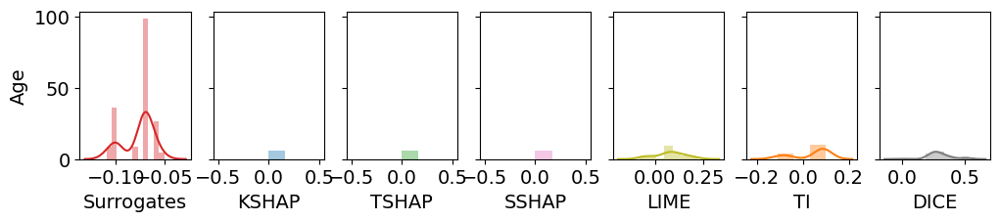

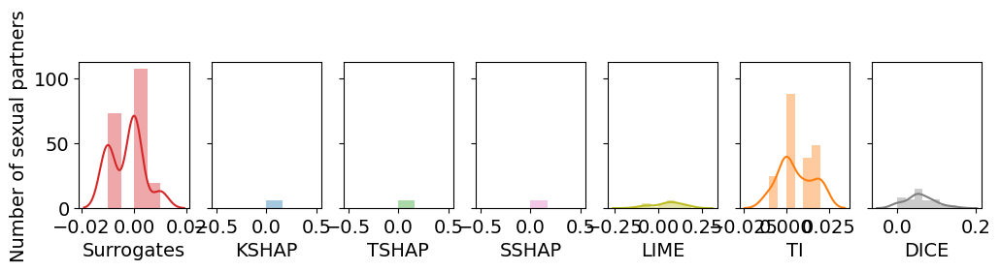

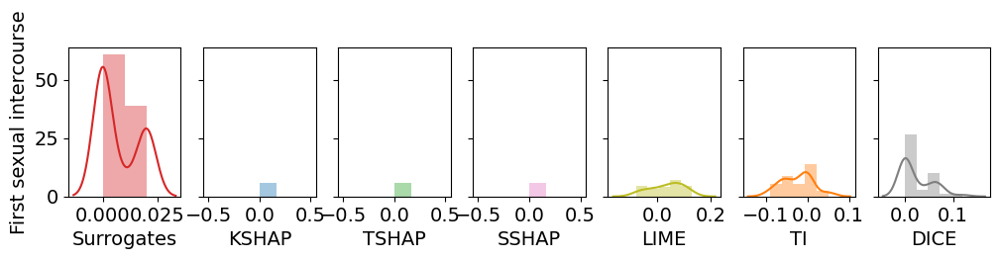

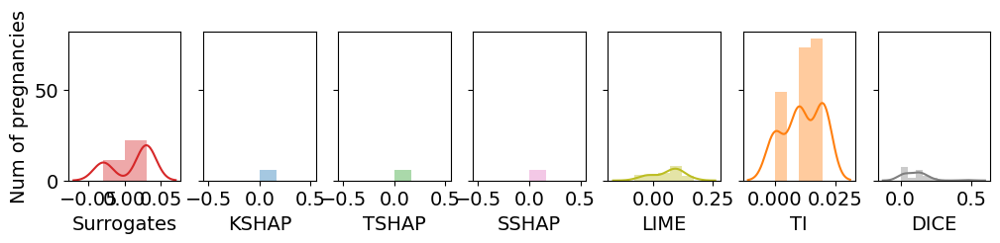

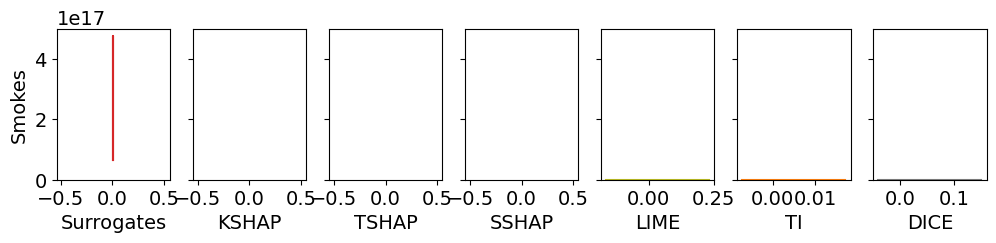

...

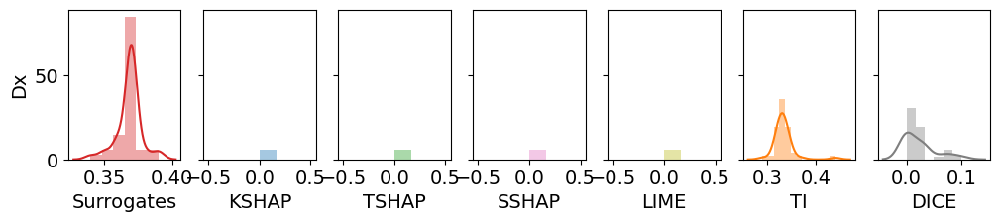

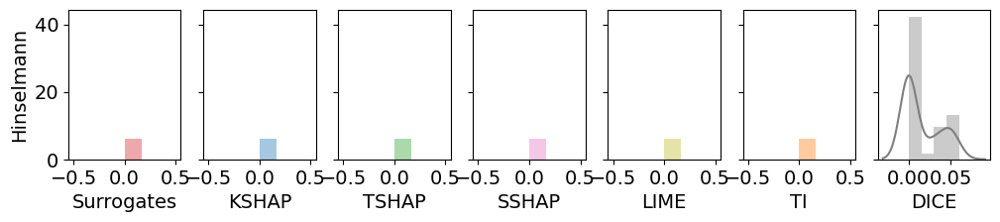

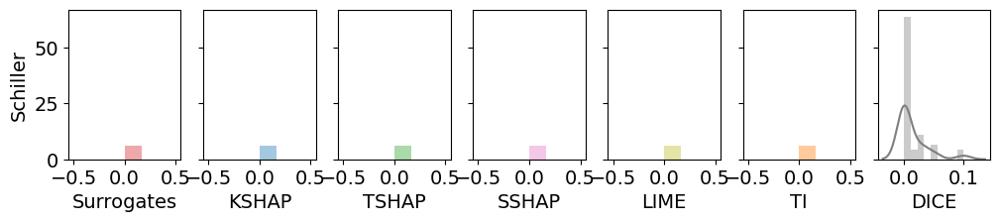

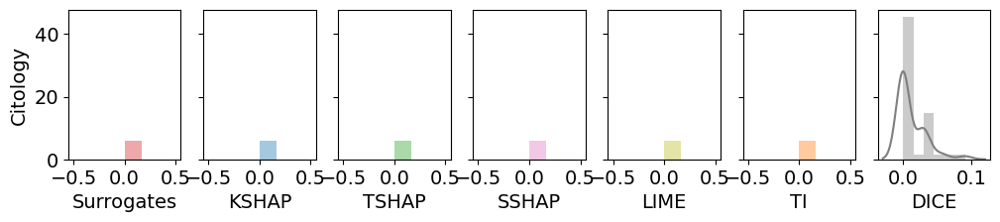

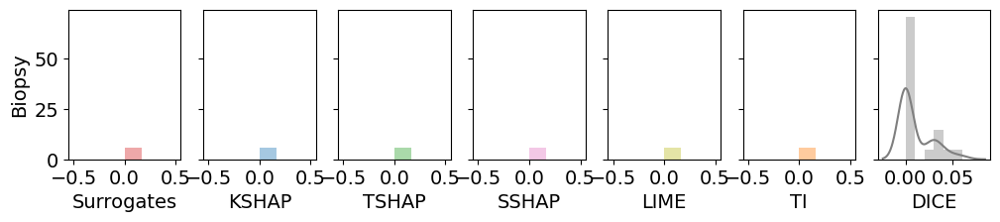

In [186]:
colors = ['tab:red', 'tab:blue', 'tab:green', 'tab:pink', 'tab:olive',  'tab:orange',  'tab:gray']

for j in range(len(features)):
  fig, axes = plt.subplots(1, 7, figsize=(12, 2), sharey=True, dpi=100)
  t=0
  
  for fg, fs in enumerate(frames):
    am=[]
    
    for i in range(len(fs['norm_shap'])):
      am.append(round(fs['norm_shap'][i][j], 2)) # i INSCTANCE j Feature
    sns.distplot(am, ax=axes[fg], color=colors[t], axlabel=methods[t])
    t=t+1 
    axes[fg].set_ylabel(features[j])
  plt.savefig(''+str(var)+str(instance)+str(features[j])[:10]+'.png', bbox_inches='tight', dpi=300)
  plt.show()

##### Multiple instances

In [187]:
features=X_test.columns

In [188]:
#compute_features_compacity(case="classification", contributions=weight, selection=list(range(0, len(x_test))), distance=0.9, nb_features=5)
frames=[]
for weight in weights:
  fs= compute_features_stability (case="classification", x=X_test, selection=list(range(0, len(X_test))), contributions=weight)
  #fs= compute_features_stability (case="classification", x=X_test, selection=[1,4], contributions=weight)
  frames.append(fs)

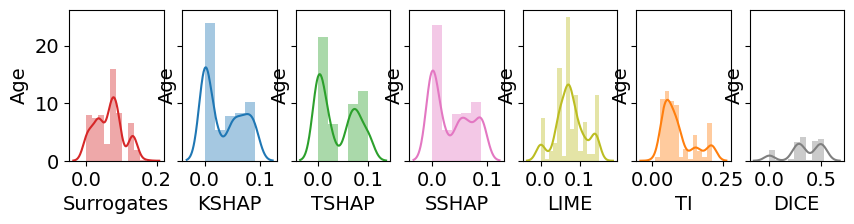

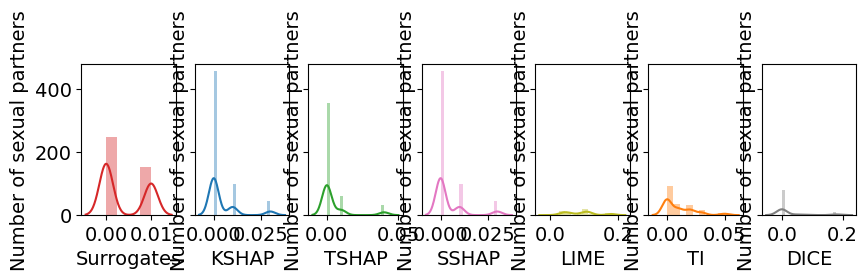

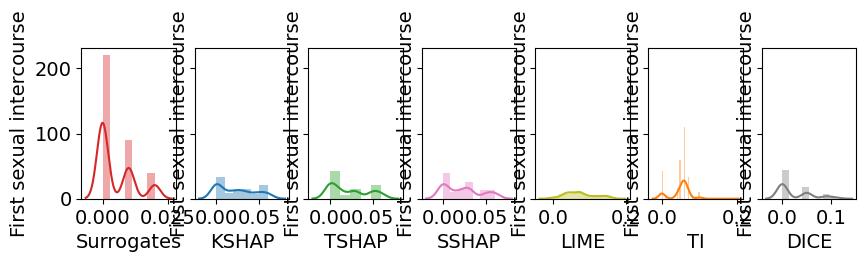

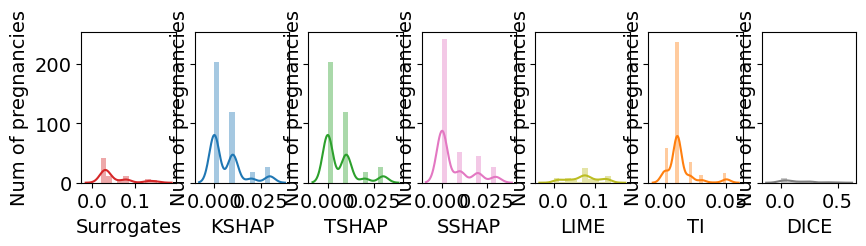

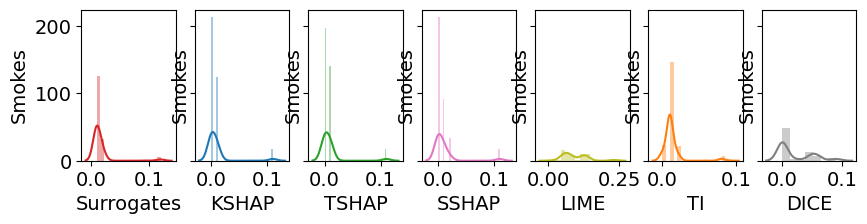

...

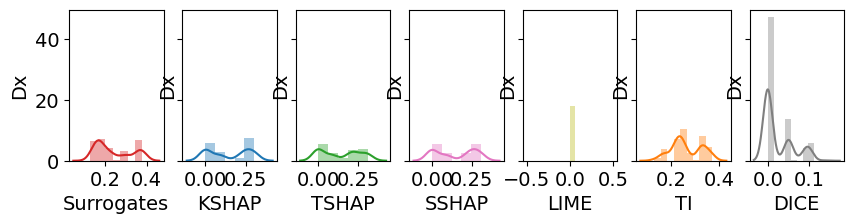

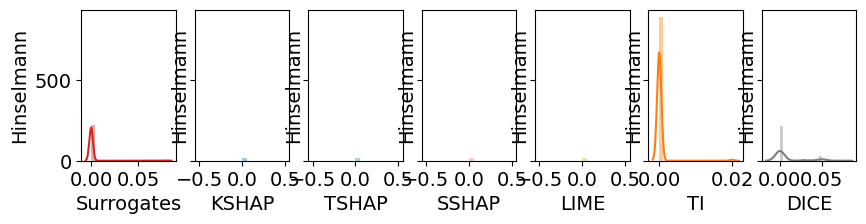

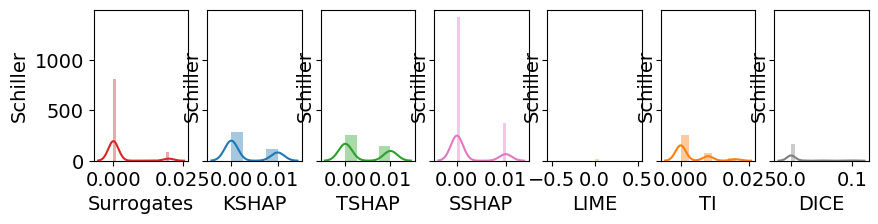

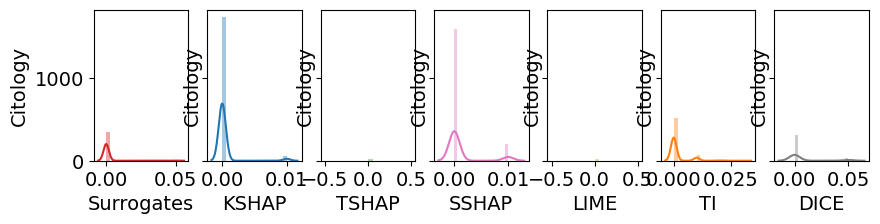

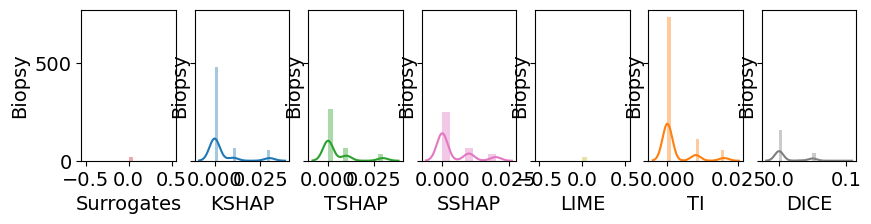

In [190]:
colors = ['tab:red', 'tab:blue', 'tab:green', 'tab:pink', 'tab:olive',  'tab:orange',  'tab:gray']

for j in range(len(features)):
  fig, axes = plt.subplots(1, 7, figsize=(10, 2), sharey=True, dpi=100)
  t=0
  for fg, fs in enumerate(frames):
    vr=[]
    am=[]
    for i in range(len(fs['variability'])):
      vr.append(round(fs['variability'][i][j], 2)) # i INSCTANCE j Feature
      am.append(round(fs['amplitude'][i][j], 2))
    axes[fg].set_ylabel(features[j])
    sns.distplot(am, ax=axes[fg], color=colors[t], axlabel=methods[t])
    t=t+1 
    #print('VR', vr)
    
  plt.savefig(''+str(var)+str(features[j])[:10]+'.png')
  plt.show()

In [191]:
t=0
for fg, fs in enumerate(frames):
  vr=[]
  am=[]
  for j in range(len(features)):
    vr.append(np.mean(fs['variability'][j])) # i INSCTANCE j Feature
    am.append(np.std(fs['variability'][j]))
  print(methods[t], round(np.mean(vr),2))
  print(methods[t], round(np.std(am),2))
  t+=1


Surrogates 0.24
Surrogates 0.28
KSHAP 2.22
KSHAP 1.06
TSHAP 2.76
TSHAP 1.03
SSHAP 2.74
SSHAP 1.03
LIME 0.27
LIME 0.02
TI 0.61
TI 0.19
DICE 1.71
DICE 0.15


##### Plots

In [192]:
xpl.plot.stability_plot(selection=[0, 1, 3])

In [ ]:
#img.write_image('/content/drive/My Drive/dataXAI/cancer/compactgs.png')

In [193]:
fig_image=xpl.plot.stability_plot()
#plt.xlabel("Local Surrogates")
plt.savefig('stabplot.png')

<Figure size 432x288 with 0 Axes>

In [195]:
#for w in weights:
#  xpl = SmartExplainer(model=model)
#  xpl.compile(x=X_test,contributions=w)
#  xpl.plot.stability_plot()

### Feature and Rank disagreement

#### Tool

In [196]:
from scipy.stats import spearmanr
import numpy as np 
import itertools

def intersection(r1, r2):
    return list(set(r1) & set(r2))

def check_size(r1, r2):
    assert len(r1) == len(r2), 'Both rankings should be the same size'

def feature_agreement(r1, r2):
    """
    Measures the fraction of common features between the 
    sets of top-k features of the two rankings. 
    
    From Krishna et al. (2022), The Disagreement Problem in 
    Explainable Machine Learning: A Practitioner’s Perspective
    
    Parameters
    ---------------
    r1, r2 : list 
        Two feature rankings of identical shape   
    """
    check_size(r1, r2)
    k = len(r1)
    
    return len(intersection(r1, r2)) / k 

def rank_agreement(r1, r2):
    """
    Stricter than feature agreement, rank agreement checks 
    that the feature order is comparable between the two rankings.
    
    From Krishna et al. (2022), The Disagreement Problem in 
    Explainable Machine Learning: A Practitioner’s Perspective
    
    Parameters
    ---------------
    r1, r2 : list 
        Two feature rankings of identical shape   
    """
    check_size(r1, r2)
    k = len(r1)
    
    return np.sum([True if x==y else False for x,y in zip(r1,r2)]) / k 

def weak_rank_agreement(r1, r2):
    """
    Check if the rank is approximately close (within one rank).
    """
    check_size(r1, r2)
    k = len(r1)
    window_size=1

    rank_agree=[]
    for i, v in enumerate(r1):
        if i == 0:
            if v in r2[i:i+window_size+1]:
                rank_agree.append(True)
            else:
                rank_agree.append(False) 
        else:
            if v in r2[i-window_size:i+window_size+1]:
                rank_agree.append(True)
            else:
                rank_agree.append(False)
                
    return np.sum(rank_agree)/k
                
                
def rank_correlation(r1, r2):
    return spearmanr(r1, r2)

# def to_rankings(df, instance=1):
#     """
#     Convert feature attributions to a list of top features.
#     """
#     columns = df.columns
#     contrib_features = [c for c in columns ]

#     vals = df[contrib_features].values[instance,:]
#     inds = np.argsort(np.absolute(vals))[::-1]
 
    
#     features = [c.replace('_contrib', '') for c in contrib_features]
#     rankings = list(np.array(features)[inds])
    
#     return inds 

def to_rankings(df, instance):
    """
    Convert feature attributions to a list of top features.
    """
    contrib_features = df.columns
     

    vals = df[contrib_features].values[instance,:]
    rankings = np.argsort(np.absolute(vals))[::-1]
    features = vals[rankings]
   
    
    return rankings 


def compute_matrices(weights, instance):
    n_rankings = len(methods)
    
    feature_agree = np.zeros((n_rankings, n_rankings))
    rank_agree = np.zeros((n_rankings, n_rankings))
    corr = np.zeros((n_rankings, n_rankings))


    for i, j in itertools.product(range(n_rankings), range(n_rankings)):
        r1 = to_rankings(weights[i], instance)[:10]
        r2 = to_rankings(weights[j], instance)[:10]
        feature_agree[i,j] = feature_agreement(r1, r2)
        rank_agree[i,j] = rank_agreement(r1, r2)
    
    return feature_agree, rank_agree

#### Plots

In [197]:
feature_agree, rank_agree = compute_matrices(weights, instance)

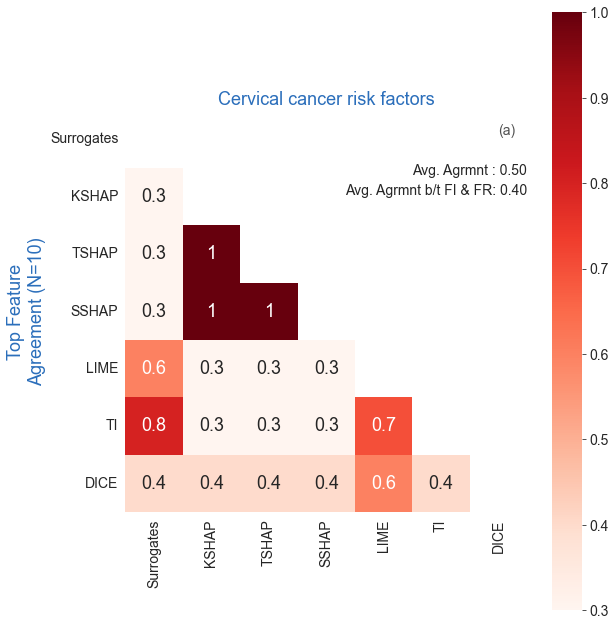

In [198]:
corr = feature_agree
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig = plt.figure(figsize=(9, 11))
with sns.axes_style("white"):
  
    ax = sns.heatmap(corr, mask=mask, square=True,annot=True, annot_kws={'fontsize': 18}, 
                xticklabels=methods, yticklabels=methods, cmap="Reds", cbar=True)
    ax.set_title("Cervical cancer risk factors", color='xkcd:medium blue', fontsize=18)
    ax.set_ylabel('Top Feature\nAgreement (N=10)', color='xkcd:medium blue', fontsize=18)
    ax.text(0.95,
                0.95,
                f"(a)",
                fontsize=14,
                alpha=0.8,
                ha="center",
                va="center",
                transform=ax.transAxes,
            )
    data=corr
    avg = np.mean(data[mask==0])
    text = f'Avg. Agrmnt : {avg:.2f}'
    ax.annotate(text, (1.0, 0.84), xycoords='axes fraction', fontsize=14, ha='right')

    avg = np.mean(data[4:, :4])
    text = f'Avg. Agrmnt b/t FI & FR: {avg:.2f}'
    ax.annotate(text, (1.0, 0.79), xycoords='axes fraction', fontsize=14, ha='right')
    
    
    
 
    plt.show()
    

In [ ]:
#fig.savefig('/content/drive/My Drive/dataXAI/cancer/featagrem'+str(instance)+'.png', bbox_inches='tight', dpi=300)

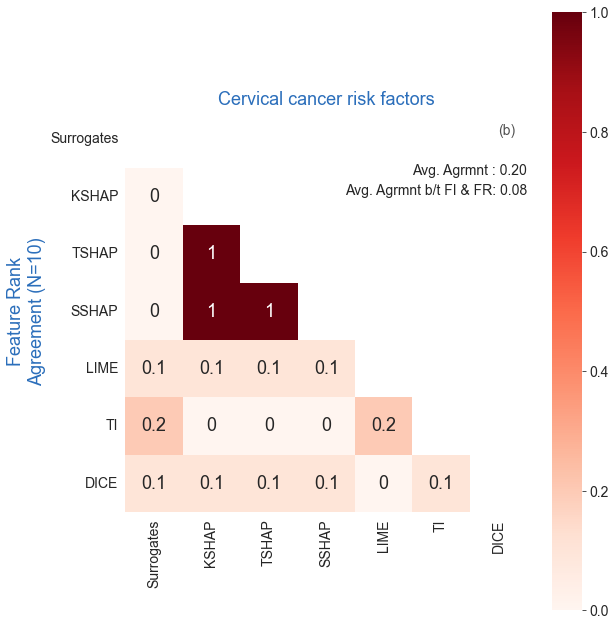

In [199]:
corr = rank_agree
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig = plt.figure(figsize=(9, 11))
with sns.axes_style("white"):
  
    ax = sns.heatmap(corr, mask=mask, square=True,annot=True, annot_kws={'fontsize': 18}, 
                xticklabels=methods, yticklabels=methods, cmap="Reds")
    ax.set_title("Cervical cancer risk factors", color='xkcd:medium blue', fontsize=18)
    ax.set_ylabel('Feature Rank\nAgreement (N=10)', color='xkcd:medium blue',fontsize=18 )

    ax.text(0.95,
                0.95,
                f"(b)",
                fontsize=14,
                alpha=0.8,
                ha="center",
                va="center",
                transform=ax.transAxes,
            )
    data=corr
    avg = np.mean(data[mask==0])
    text = f'Avg. Agrmnt : {avg:.2f}'
    ax.annotate(text, (1.0, 0.84), xycoords='axes fraction', fontsize=14, ha='right')

    avg = np.mean(data[4:, :4])
    text = f'Avg. Agrmnt b/t FI & FR: {avg:.2f}'
    ax.annotate(text, (1.0, 0.79), xycoords='axes fraction', fontsize=14, ha='right')
    
    
 
    plt.show()

In [ ]:
#fig.savefig('/content/drive/My Drive/dataXAI/cancer/rankagrem'+str(instance)+'.png', bbox_inches='tight', dpi=300)


### Results
  1. We have been able to run most of the given ML models and reproduce similar evaluation metrics as mentioned in the paper with random forest coming out as one of the top models which we have later used to produce local explanations
  2. We have been able to reproduce some of the results like correctly producing graphs for record 129 with explainable models like DICE, Tree interpreter, LIME etc
  
### Analyses
  1. We see high correlation between HPV and Cervical Cancer diagnosis
  2. We see that Random Forest, MLP and Logistic Regression are able to produce a score of 1 on all the five evaluation metrics - F1 score, AUROC, Accuracy, Precision, Recall
  
### Plans
  1. Complete the pending evaluations and results for compactness, stability, consistency, faithfulness so as to match the ones provided in the paper - currently our results are slightly off from what is expected probably due to running the explanation models with undersampled data. For final submission we will ensure to run the models with complete data like in the paper and try to match the results in the paper.
  2. We will try out some ablations like trying different sampling techniques, different ML models
  3. Organizing the code in a much more readable fashion - there are a lot of comments since some of it is still being worked on 
  